# Importing Libraries

In [8]:
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models, utils
from torchvision import datasets, transforms

from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from torchvision.utils import make_grid
from collections import Counter
import random
from PIL import ImageStat
import pickle

from IPython.display import Image as IMG, display
import base64
from openai import OpenAI
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from tqdm import tqdm
import cv2

# Data Preparation 

## Defining Data Sources

The raw dataset consists of images of sawn teak wood, categorized into three grades based on quality.

Grade Representation:

<li>Grade A (Highest Quality) → Represented by 2</li>
<li>Grade B (Medium Quality) → Represented by 1</li> 
<li>Grade C (Lowest Quality) → Represented by 0</li>

Dataset Structure: The dataset is organized into subfolders within the raw dataset directory. Each subfolder corresponds to a specific grade and contains images belonging to that grade. This structure ensures that each image is correctly labeled according to its quality grade for training and evaluation purposes.

In [2]:
# Define dataset paths
dataset_path = 'dataset' # root path for image datasets
raw_images_path = dataset_path + '/raw' # path of raw images

## Exploratory Data Analysis (EDA) and Data Pre-processing

### Loading the Raw Dataset

In [3]:
# Define the transformation pipeline with resizing and grayscale conversion
initial_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the images to 224x224
])

raw_data = datasets.ImageFolder(raw_images_path, transform=initial_transform) # Load the raw dataset

### Verifying Class Labels in the Dataset

In [4]:
class_names = raw_data.classes

print(f"Classes in dataset: {class_names}")

Classes in dataset: ['0', '1', '2', '3']


### Validating the Clustering Visually

#### Loading the dataset for clustering

In [5]:
transform_for_clustering = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the images to 224x224
#     transforms.Grayscale(num_output_channels=1),  # Convert to grayscale
    transforms.ToTensor(),  # Convert images to tensors
])

raw_data_clus = datasets.ImageFolder(raw_images_path, transform=transform_for_clustering)

# Optional: Use DataLoader if needed for batch processing
data_loader_clus = DataLoader(raw_data_clus, batch_size=32, shuffle=True)

#### Feature Extraction for Clustering

In [6]:
model_clus = models.resnet18(pretrained=True)
model_clus.eval()  # Set the model to evaluation mode

# Remove the final classification layer to get features from the penultimate layer
model_clus = nn.Sequential(*list(model_clus.children())[:-1])  # Remove the last fully connected layer

# Function to extract features from the model
def extract_features(dataset):
    features = []
    filenames = []
    
    # Use tqdm to display a progress bar
    for img, label in tqdm(dataset, desc="Extracting features", total=len(dataset)):
        img = img.unsqueeze(0)  # Add batch dimension
        feature = model_clus(img)  # Forward pass through the model
        feature = feature.view(feature.size(0), -1)  # Flatten the feature map
        features.append(feature)
        filenames.append(dataset.imgs[len(features)-1][0])  # Get the image file path
        
    return torch.cat(features, dim=0), filenames

# Extract features
features, filenames = extract_features(raw_data_clus)

C:\Users\User\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Extracting features: 100%|█████████████████████████████████████████████████████████| 1893/1893 [12:21<00:00,  2.55it/s]


#### Applying KMeans clustering

In [9]:
# using 4 clusters for validation
kmeans = KMeans(n_clusters=4, random_state=42)
cluster_labels = kmeans.fit_predict(features.detach().numpy())

C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


#### Visualizing the Clusters

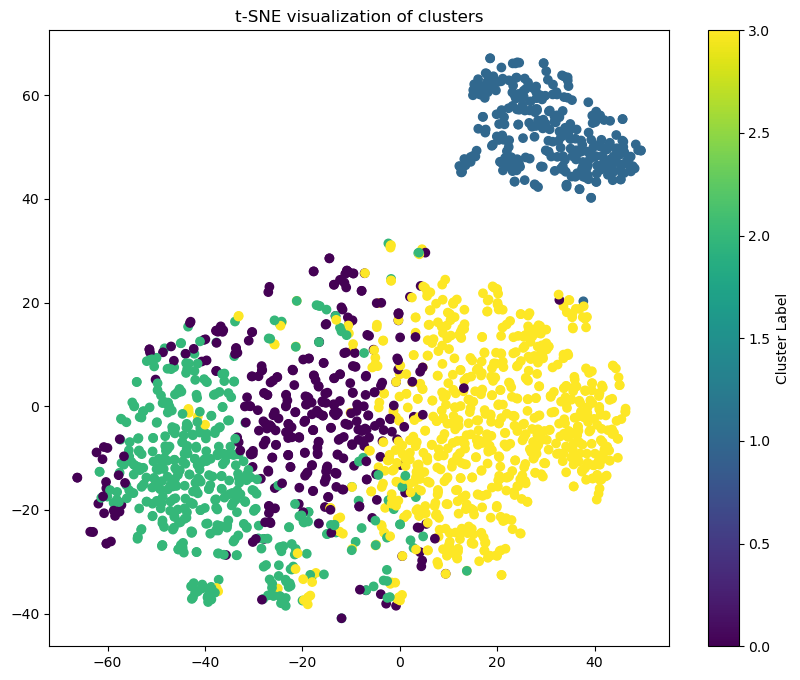

In [15]:
tsne = TSNE(n_components=2, random_state=42)
reduced_features = tsne.fit_transform(features.detach().numpy())

# Plot the clusters
plt.figure(figsize=(10, 8))
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=cluster_labels, cmap='viridis')
plt.title('t-SNE visualization of clusters')
plt.colorbar(label='Cluster Label')
plt.show()

#### Comparing the identified clusters with ground truth

In [11]:
# Get original labels from the dataset
original_labels = [label for _, label in raw_data_clus]

# Create a DataFrame to compare original labels and cluster labels
df = pd.DataFrame({
    'Image': filenames,
    'Original_Label': original_labels,
    'Cluster_Label': cluster_labels
})

In [12]:
print(df.head())

                   Image  Original_Label  Cluster_Label
0    dataset/raw\0\1.jpg               0              1
1   dataset/raw\0\10.jpg               0              3
2  dataset/raw\0\100.jpg               0              3
3  dataset/raw\0\101.jpg               0              1
4  dataset/raw\0\102.jpg               0              3


In [13]:
df.to_excel("cluster analysis.xlsx", index=False) 

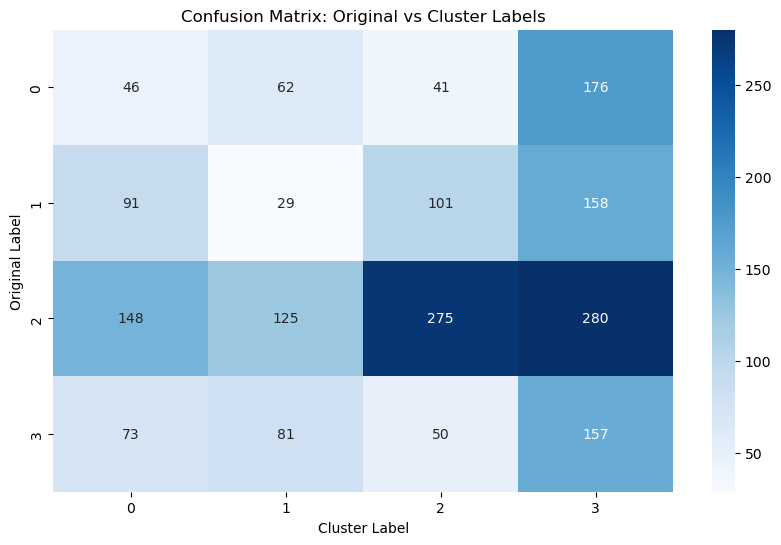

In [17]:
# Create confusion matrix
cm = confusion_matrix(df['Original_Label'], df['Cluster_Label'])

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=sorted(df['Cluster_Label'].unique()), 
            yticklabels=sorted(df['Original_Label'].unique()))
plt.xlabel('Cluster Label')
plt.ylabel('Original Label')
plt.title('Confusion Matrix: Original vs Cluster Labels')
plt.show()

### Total number of images in raw dataset

In [5]:
print(f"Total number of images in raw dataset: {len(raw_data)}") 

Total number of images in raw dataset: 1893


### Number of Images in each grade

In [6]:
def count_images_in_each_grade(dataset,class_names):
    class_counts = Counter(dataset.targets)
    class_labels = [class_names[idx] for idx in class_counts.keys()]
    counts = list(class_counts.values())
    
    for class_idx, count in class_counts.items():
        print(f"Class {class_names[class_idx]}: {count} images")
        
    plt.figure(figsize=(10, 6)) 
    plt.bar(class_labels, counts, color='darkgreen')
    plt.xlabel('Grades')
    plt.ylabel('Number of Images')
    plt.title('Distribution of Images by Grades')
    plt.xticks(rotation=45)
    plt.show()

Distribution of Images by Grade in raw dataset
Class 0: 325 images
Class 1: 379 images
Class 2: 828 images
Class 3: 361 images


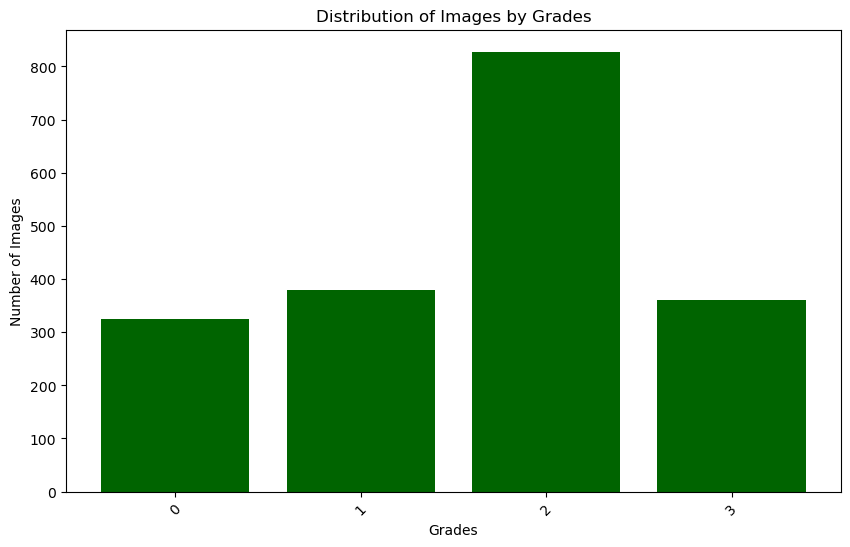

In [7]:
print('Distribution of Images by Grade in raw dataset')
count_images_in_each_grade(raw_data,class_names)

### Visual Inspection of Sample Images

In [9]:
def show_random_images_by_class(dataset, num_classes=5, num_images_per_class=5):
    # Create a grid layout for displaying images: num_classes rows, num_images_per_class columns
    fig, axes = plt.subplots(num_classes, num_images_per_class, figsize=(num_images_per_class * 3, num_classes * 3))

    # Dictionary to store images by class
    images_by_class = {i: [] for i in range(num_classes)}

    # Group images by their class labels
    for img, label in dataset:
        if len(images_by_class[label]) < num_images_per_class:
            images_by_class[label].append(img)
    
    # Now display num_images_per_class random images for each class
    for class_idx in range(num_classes):
        # Randomly select num_images_per_class images from the collected images of each class
        random_images = random.sample(images_by_class[class_idx], num_images_per_class)
        
        for img_idx, img in enumerate(random_images):
            ax = axes[class_idx, img_idx]  # Get the subplot for the class and image index
            
            # If the image is in shape (1, 224, 224), remove the single channel dimension
            img_array = np.array(img)  # Convert PIL image to NumPy array
            if img_array.shape[0] == 1:  # Check if the image has a single channel
                img_array = img_array.squeeze(0)  # Remove the extra channel dimension
            
            ax.imshow(img_array, cmap="gray")  # Show the image (grayscale colormap)
            ax.set_title(f'Class: {dataset.classes[class_idx]}')  # Set the title as the class label
            ax.axis('off')  # Turn off the axes

    plt.tight_layout()
    plt.show()

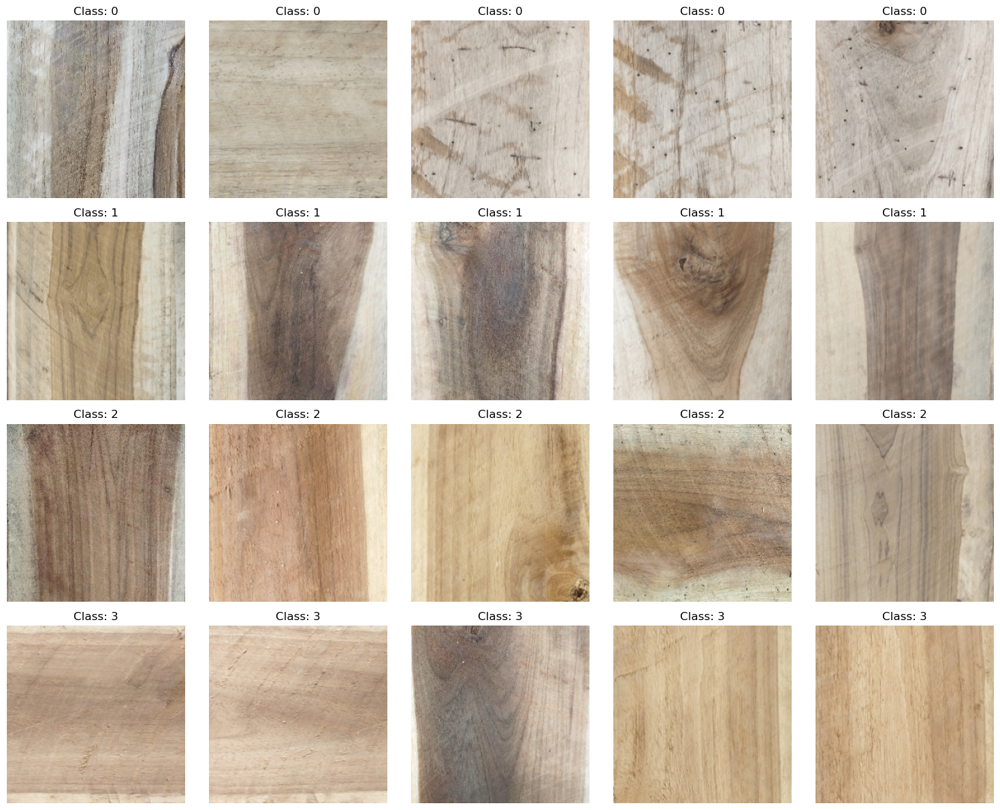

In [10]:
# Call the function to display sample images from each class
show_random_images_by_class(raw_data, num_classes=4,num_images_per_class=5)

### Outlier Analysis in Raw Dataset Images

#### Verifying Image Dimensions and Aspect Ratios in the Raw Dataset

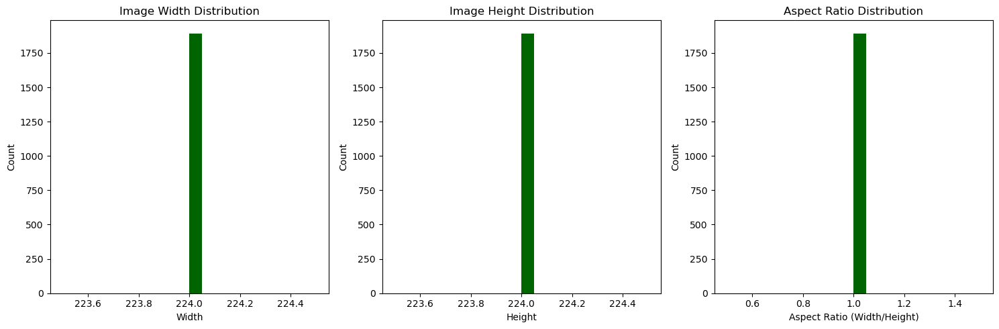

In [11]:
def check_image_dimensions(dataset):
    # Get the image sizes (width, height) for each image
    image_sizes = [img.size for img, _ in dataset]  # Extract (width, height)
    widths, heights = zip(*image_sizes)  # widths and heights as separate lists

    # Plot width distribution
    plt.figure(figsize=(15,5))
    plt.subplot(1, 3, 1)
    plt.hist(widths, bins=20, color='darkgreen')
    plt.xlabel('Width')
    plt.ylabel('Count')
    plt.title('Image Width Distribution')

    # Plot height distribution
    plt.subplot(1, 3, 2)
    plt.hist(heights, bins=20, color='darkgreen')
    plt.xlabel('Height')
    plt.ylabel('Count')
    plt.title('Image Height Distribution')
    
    # Plot aspect ratio distribution
    aspect_ratios = [w/h for w, h in image_sizes]
    plt.subplot(1, 3, 3)
    plt.hist(aspect_ratios, bins=20, color='darkgreen')
    plt.xlabel('Aspect Ratio (Width/Height)')
    plt.ylabel('Count')
    plt.title('Aspect Ratio Distribution')

    plt.tight_layout()
    plt.show()

check_image_dimensions(raw_data)

### Split the raw dataset into Train, Validation and Test datasets

In [9]:
train_dir_name = "train"
val_dir_name = "val"
test_dir_name = "test"

In [15]:
# Method to extract, split and save the data
def extract_split_and_save_data(raw_data, dataset_path, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15):
    # Extract images and labels from raw_data
    images = []
    labels = []
    for img, label in raw_data:
        images.append(img)
        labels.append(label)
    
    # Step 1: Split into train and temp (val+test)
    train_images, temp_images, train_labels, temp_labels = train_test_split(
        images, labels, test_size=(val_ratio + test_ratio), stratify=labels, random_state=42
    )

    # Step 2: Split temp into validation and test
    val_images, test_images, val_labels, test_labels = train_test_split(
        temp_images, temp_labels, test_size=(test_ratio / (val_ratio + test_ratio)), stratify=temp_labels, random_state=42
    )

    # Function to save images into directories
    def save_images(images, labels, split_name):
        split_path = os.path.join(dataset_path, split_name)
        os.makedirs(split_path, exist_ok=True)
        
        # Create class directories inside the split folder
        for class_name in set(labels):
            os.makedirs(os.path.join(split_path, str(class_name)), exist_ok=True)
        
        # Save images to respective class directories
        for idx, (img, label) in enumerate(zip(images, labels)):
            dest_folder = os.path.join(split_path, str(label))
            os.makedirs(dest_folder, exist_ok=True)

            # Define a unique filename
            img_filename = f"{idx}.png"
            img_path = os.path.join(dest_folder, img_filename)

            # Save the image object to the destination folder
            if isinstance(img, Image.Image):  # Check if it's a PIL Image
                img.save(img_path)
            else:
                raise TypeError(f"Unsupported image type: {type(img)}")

    # Save the images into respective folders
    save_images(train_images, train_labels, train_dir_name)
    save_images(val_images, val_labels, val_dir_name)
    save_images(test_images, test_labels, test_dir_name)

    print("Dataset successfully split and stored in 'dataset' folder.")

# Call the method to extract, split, and save the data
extract_split_and_save_data(raw_data, dataset_path)

Dataset successfully split and stored in 'dataset' folder.


### Loading Train, Val and Test Dataset

In [10]:
train_dir = dataset_path + '/' + train_dir_name # path of train dataset
val_dir = dataset_path + '/' + val_dir_name # path of validation dataset
test_dir = dataset_path + '/' + test_dir_name # path of test dataset

train_data = datasets.ImageFolder(train_dir,transform=initial_transform) # Load the train dataset
val_data = datasets.ImageFolder(val_dir,transform=initial_transform) # Load the validation dataset
test_data = datasets.ImageFolder(test_dir,transform=initial_transform) # Load the test dataset

### Check the class labels in each dataset

In [16]:
train_class_names = train_data.classes
val_class_names = val_data.classes
test_class_names = test_data.classes

print(f"Classes in train dataset: {train_class_names}")
print(f"Classes in val dataset: {val_class_names}")
print(f"Classes in test dataset: {test_class_names}")

Classes in train dataset: ['0', '1', '2', '3']
Classes in val dataset: ['0', '1', '2', '3']
Classes in test dataset: ['0', '1', '2', '3']


### Number of images in each dataset

In [11]:
total_train_images = len(train_data)
total_val_images = len(val_data)
total_test_images = len(test_data)

print(f"Total images in train dataset: {total_train_images}")
print(f"Total images in validation dataset: {total_val_images}")
print(f"Total images in test dataset: {total_test_images}")

Total images in train dataset: 1325
Total images in validation dataset: 284
Total images in test dataset: 284


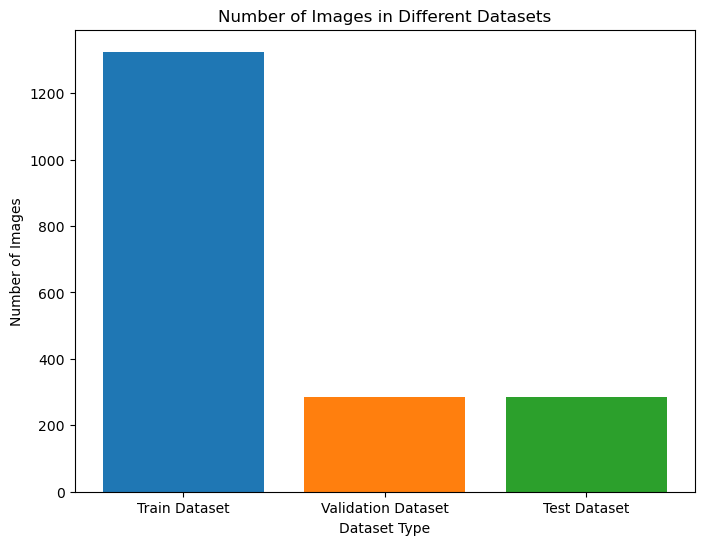

In [15]:
# Visualizing the nuber of images in each dataset
dataset_types = ['Train Dataset', 'Validation Dataset', 'Test Dataset']
image_counts = [total_train_images, total_val_images, total_test_images]

plt.figure(figsize=(8,6))
plt.bar(dataset_types, image_counts, color=['#1f77b4', '#ff7f0e', '#2ca02c'])
plt.title('Number of Images in Different Datasets')
plt.xlabel('Dataset Type')
plt.ylabel('Number of Images')
plt.show()

### Split percentage values of Train, Validation and Test datasets

In [13]:
total_images = total_train_images + total_val_images + total_test_images

train_percentage = (total_train_images / total_images) * 100
val_percentage = (total_val_images / total_images) * 100
test_percentage = (total_test_images / total_images) * 100

print(f"Total images in train dataset: {total_train_images} ({train_percentage:.2f}%)")
print(f"Total images in validation dataset: {total_val_images} ({val_percentage:.2f}%)")
print(f"Total images in test dataset: {total_test_images} ({test_percentage:.2f}%)")

Total images in train dataset: 1325 (69.99%)
Total images in validation dataset: 284 (15.00%)
Total images in test dataset: 284 (15.00%)


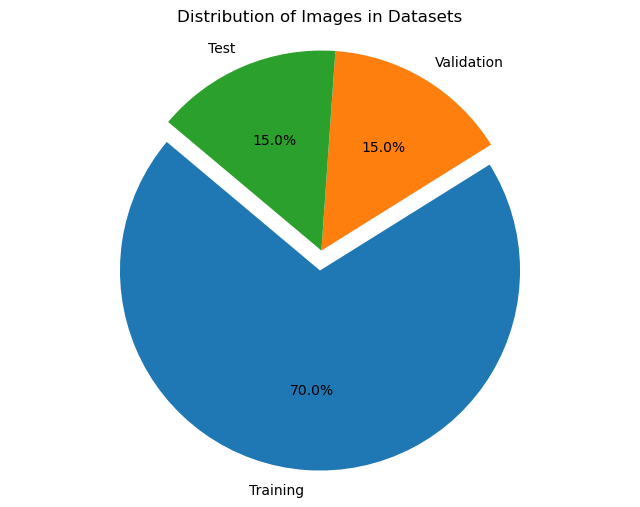

In [14]:
# Visualizing the split percentage values of Train, Validation and Test datasets
labels = ['Training', 'Validation', 'Test']
sizes = [total_train_images, total_val_images, total_test_images]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']
explode = (0.1, 0, 0)  # explode the 1st slice (Train dataset)

plt.figure(figsize=(8, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=False, startangle=140)
plt.axis('equal')  
plt.title('Distribution of Images in Datasets')
plt.show()

### Distribution of Images by Severity Level

Distribution of Images by Grade in Train dataset
Class 0: 227 images
Class 1: 265 images
Class 2: 580 images
Class 3: 253 images


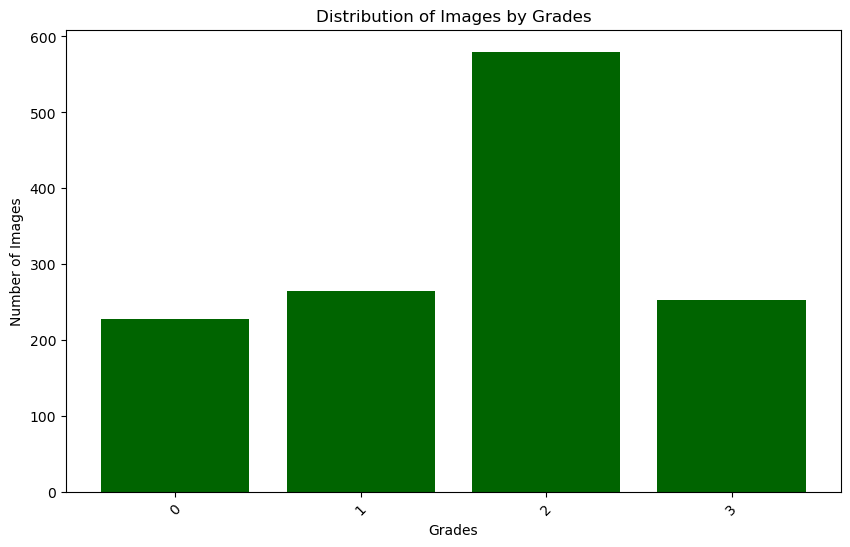


Distribution of Images by Grade in Validation dataset
Class 0: 49 images
Class 1: 57 images
Class 2: 124 images
Class 3: 54 images


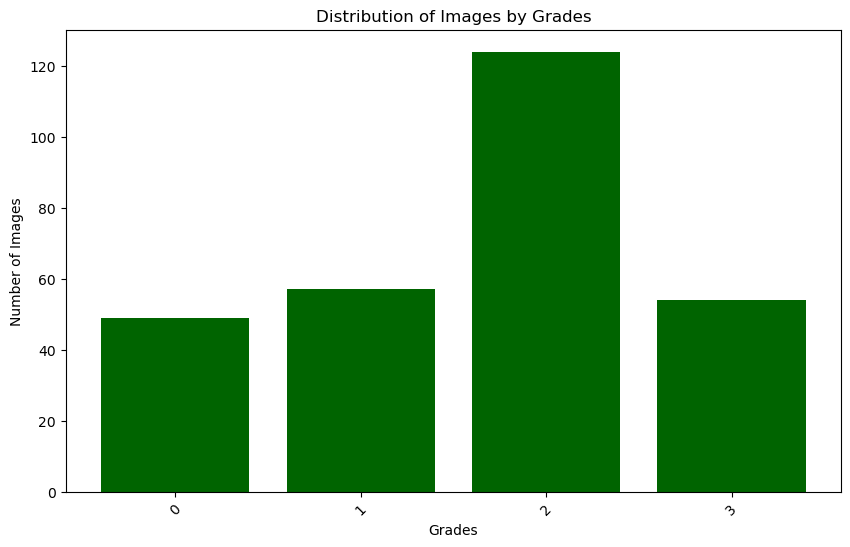


Distribution of Images by Grade in Test dataset
Class 0: 49 images
Class 1: 57 images
Class 2: 124 images
Class 3: 54 images


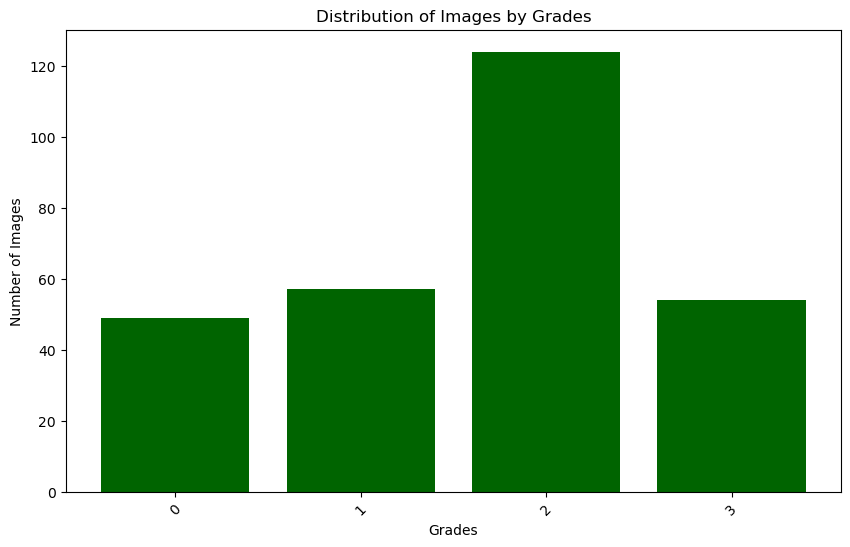

In [17]:
print('Distribution of Images by Grade in Train dataset')
count_images_in_each_grade(train_data,class_names)
print()
print('Distribution of Images by Grade in Validation dataset')
count_images_in_each_grade(val_data,class_names)
print()
print('Distribution of Images by Grade in Test dataset')
count_images_in_each_grade(test_data,class_names)
print()

### Inspect sample images in training dataset

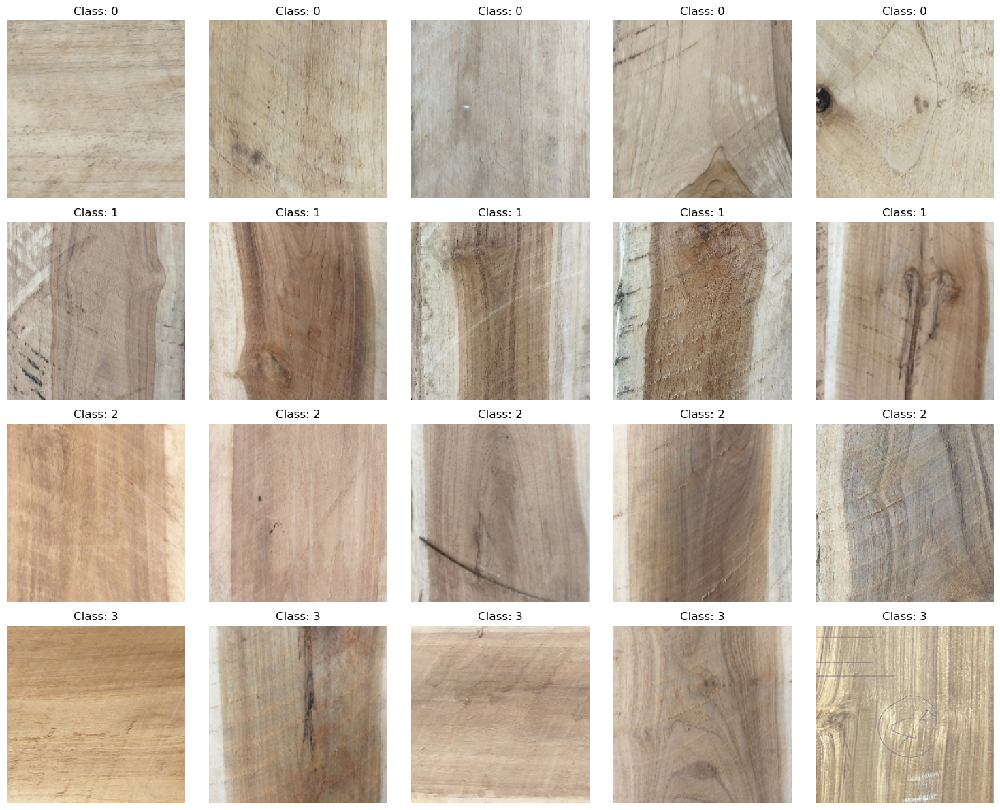

In [24]:
# Call the function to display sample images from each class
show_random_images_by_class(train_data, num_classes=4,num_images_per_class=5)

### Brightness Analysis of the Training Dataset

#### Brightness Distribution Analysis

In [18]:
def calculate_brightness(image):
    stat = ImageStat.Stat(image)
    return stat.mean[0]

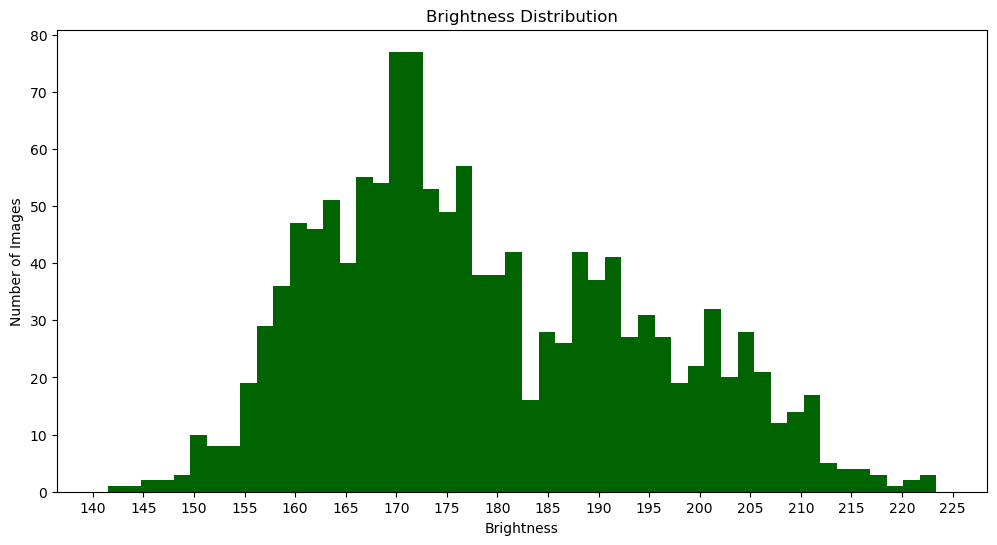

In [34]:
def brightness_analysis(dataset):
    brightness_values = [calculate_brightness(img) for img, _ in dataset]
    
    # Increase the number of bins for a more detailed histogram
    bins = 50  # You can adjust the number of bins as needed
    
    # Set the figure size to extend the chart horizontally
    plt.figure(figsize=(12, 6))  # Width is 12 and height is 6, adjust as needed
    
    # Plot the histogram
    plt.hist(brightness_values, bins=bins, color='darkgreen')

    # Set the x-axis limits based on the data range
    min_brightness = min(brightness_values)
    max_brightness = max(brightness_values)
    
    # Define the x-axis limits with padding
    plt.xlim(min_brightness - 5, max_brightness + 5)  # Adjust the limits with padding
    
    # Create x-ticks with a step of 5
    x_ticks = range(int(min_brightness) // 5 * 5, int(max_brightness) + 5, 5)  # Round to nearest multiple of 5
    plt.xticks(x_ticks)  # Set the x-ticks to the generated range
    
    # Labeling and displaying the plot
    plt.xlabel('Brightness')
    plt.ylabel('Number of Images')
    plt.title('Brightness Distribution')
    plt.show()
    
brightness_analysis(train_data)

#### Inspecting Sample Images Based on Brightness Ranges in the Raw Dataset

In [19]:
def display_images_by_brightness(dataset, target_class, min_brightness, max_brightness, num_images=5):
    filtered_images_temp = []
    for img, label in dataset:  # Loop through dataset and calculate brightness
        if label == target_class:  # Check if the image belongs to the target class
            brightness = calculate_brightness(img)  # Calculate brightness in [0, 255]
            if min_brightness <= brightness <= max_brightness:  # Check if the brightness falls within the specified range
                filtered_images_temp.append((img, brightness, label))
        if len(filtered_images_temp) >= num_images:  # Stop when we have enough images from the target class
            break
    
    # If there are no images that meet the brightness criteria, return early
    if not filtered_images_temp:
        print("No images found within the specified brightness range.")
        return
    
    # Display the images in a grid
    fig, axes = plt.subplots(1, len(filtered_images_temp), figsize=(15, 5))
    if len(filtered_images_temp) == 1:
        axes = [axes]  # Ensure axes is iterable even for a single image
    
    for i, (img, brightness, label) in enumerate(filtered_images_temp):
        axes[i].imshow(img)
        axes[i].set_title(f'Brightness: {brightness:.2f}\nClass: {dataset.classes[label]}')
        axes[i].axis('off')
    
    plt.show()

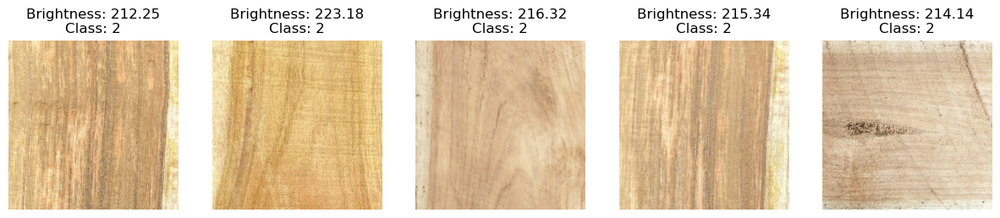

In [37]:
display_images_by_brightness(train_data,2,min_brightness=212,max_brightness=225)

## Data Preprocessing

### Handling Dark and Overly Bright Images

In [38]:
def is_dark(image, threshold=80):
    # Convert image to grayscale and calculate average pixel intensity
    img_gray = image.convert("L")  # Convert to grayscale
    avg_intensity = np.mean(np.array(img_gray))
    return avg_intensity < threshold

def is_bright(image, threshold=200):
    # Convert image to grayscale and calculate average pixel intensity
    img_gray = image.convert("L")  # Convert to grayscale
    avg_intensity = np.mean(np.array(img_gray))
    return avg_intensity > threshold

def filter_images(dataset, dark_threshold=50, bright_threshold=200):
    filtered_images = []
    filtered_labels = []

    for img, label in dataset:
        if not is_dark(img, dark_threshold) and not is_bright(img, bright_threshold):
            filtered_images.append(img)
            filtered_labels.append(label)

    return filtered_images, filtered_labels

# Filter images: Too dark and overly bright images are discarded
filtered_images, filtered_labels = filter_images(train_data,dark_threshold=149, bright_threshold=212)

### Number of images after filtering

In [39]:
print(f"Image Count After Removing Dark and Overly Bright Images: {len(filtered_images)}")

Image Count After Removing Dark and Overly Bright Images: 1145


### Counting the gradewise images after filtering

In [40]:
def count_images(labels, class_names):
    class_counts = Counter(labels)  # Count occurrences of each class label
    class_labels = [class_names[idx] for idx in class_counts.keys()]  # Map class indices to names
    counts = list(class_counts.values())

    for class_idx, count in class_counts.items():
        print(f"Class {class_names[class_idx]}: {count} images")

    plt.figure(figsize=(10, 6)) 
    plt.bar(class_labels, counts, color='darkgreen')
    plt.xlabel('Grades')
    plt.ylabel('Number of Images')
    plt.title('Distribution of Images by Grade')
    plt.xticks(rotation=45)
    plt.show()

Distribution of Images by grade in filtered dataset
Class 0: 216 images
Class 1: 231 images
Class 2: 472 images
Class 3: 226 images


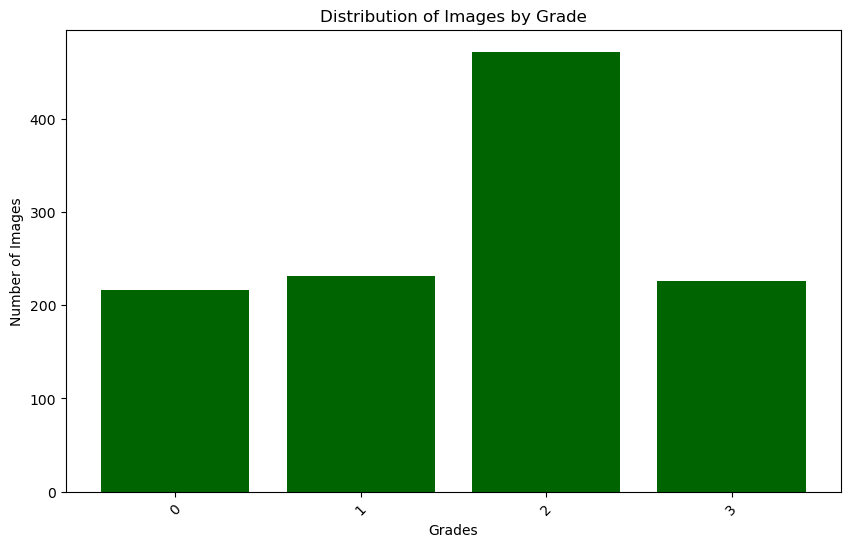

In [41]:
# Call the function with filtered labels
print('Distribution of Images by grade in filtered dataset')
count_images(filtered_labels, class_names)

### Handling the imbalanced data in train dataset

In [42]:
class AugmentedImageDataset(Dataset):
    def __init__(self, images, labels, transform=None, minority_classes=None, augment_factors=None):
        self.images = images
        self.labels = labels
        self.transform = transform
        self.minority_classes = minority_classes if minority_classes else []
        self.augment_factors = augment_factors if augment_factors else {}
        self.targets = labels
        self.minority_images, self.minority_labels = self._get_minority_samples() # Get minority samples
        self.augmented_images, self.augmented_labels = self._augment_minority_samples() # Create augmented samples

    def _get_minority_samples(self):
        minority_images = []
        minority_labels = []
        for img, label in zip(self.images, self.labels):
            if label in self.minority_classes:
                minority_images.append(img)
                minority_labels.append(label)
        return minority_images, minority_labels

    def _augment_minority_samples(self):
        augmented_images = []
        augmented_labels = []
        for img, label in zip(self.minority_images, self.minority_labels):
            # Add original image first
            augmented_images.append(img)
            augmented_labels.append(label)
            
            # Get the augment factor for this label
            augment_factor = self.augment_factors.get(label, 1)  # Default to 1 if not specified

            # Now apply augmentations based on the augment_factor
            for _ in range(augment_factor - 1):  # Minus one because we already added the original
                if self.transform:
                    augmented_img = self.transform(img)
                    augmented_images.append(augmented_img)
                    augmented_labels.append(label)

        return augmented_images, augmented_labels

    def __len__(self):
        return len(self.images) + len(self.augmented_images)

    def __getitem__(self, idx):
        # If the index is within the original dataset range, return original data
        if idx < len(self.images):
            img = self.images[idx]
            label = self.labels[idx]
        else:
            # Return augmented samples
            idx = idx - len(self.images)  # Shift index to augmented data range
            img = self.augmented_images[idx]
            label = self.augmented_labels[idx]
        
        # Ensure that the image is in PIL format before transformation
        if isinstance(img, torch.Tensor):
            img = transforms.ToPILImage()(img)  # Convert tensor to PIL Image if necessary
        if self.transform:
            img = self.transform(img)

        return img, label

In [43]:
# Define augmentation for minority class images
augmentation_transform = transforms.Compose([
    transforms.RandomRotation(15),
    transforms.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0)),
    transforms.ToTensor(),
])

minority_classes = [0,1,2,3]
augment_factors = {
    0: 4,  # Augment class d by 1 times
    1: 4,  # Augment class c by 1 times
    2: 2,  # Augment class c by 1 times
    3: 4,  # Augment class a by 1 times
}

# Create the dataset with augmentation for minority classes
augmented_train_data = AugmentedImageDataset(
    images=filtered_images, 
    labels=filtered_labels, 
    transform=augmentation_transform, 
    minority_classes=minority_classes, 
    augment_factors=augment_factors  # Pass the dictionary of augment factors
)

### Number of images after filtering

In [44]:
print(f"Image Count After Augmentation: {len(augmented_train_data)}")

Image Count After Augmentation: 4781


### Counting the gradewise images after augmentation

Distribution of Images by Grade in Filtered Train dataset
Class 0: 1080 images
Class 1: 1155 images
Class 2: 1416 images
Class 3: 1130 images


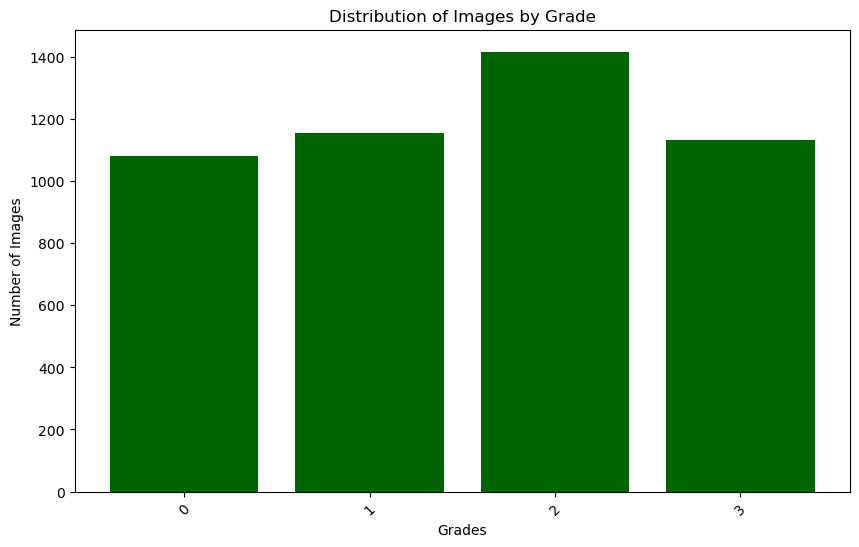

In [46]:
def count_images_after_augmentation(dataset, class_names):
    
    original_counts = Counter(dataset.labels) # Count images in the original dataset
    augmented_counts = Counter(dataset.augmented_labels) # Count images in the augmented dataset

    # Combine counts
    combined_counts = original_counts.copy()
    for class_idx, count in augmented_counts.items():
        combined_counts[class_idx] += count

    # Prepare labels and counts for plotting
    class_labels = [class_names[idx] for idx in combined_counts.keys()]
    counts = list(combined_counts.values())

    # Print counts
    for class_idx, count in combined_counts.items():
        print(f"Class {class_names[class_idx]}: {count} images")
        
    plt.figure(figsize=(10, 6)) 
    plt.bar(class_labels, counts, color='darkgreen')
    plt.xlabel('Grades')  # X-axis label
    plt.ylabel('Number of Images')  # Y-axis label
    plt.title('Distribution of Images by Grade')  # Chart title
    plt.xticks(rotation=45)  # Rotate x-axis labels if necessary
    plt.show()  # Display the chart

print('Distribution of Images by Grade in Filtered Train dataset')
count_images_after_augmentation(augmented_train_data,class_names)
print()

# Prepare Tranform pipeline for CNN Model building

### Prepare Tranform pipeline

In [49]:
# Function to calculate mean and std for the filtered dataset
def compute_mean_std(dataset):
    loader = DataLoader(dataset, batch_size=32, shuffle=False)
    
    mean = 0.0
    std = 0.0
    total_samples = 0
    
    for images, _ in loader:
        batch_samples = images.size(0)
        images = images.view(batch_samples, images.size(1), -1)  # Flatten the images
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)
        total_samples += batch_samples
    
    mean /= total_samples
    std /= total_samples
    
    return mean, std

# Compute the mean and std
mean, std = compute_mean_std(augmented_train_data)
print(f"Mean: {mean}, Std: {std}")

Mean: tensor([0.6864, 0.6173, 0.5409]), Std: tensor([0.1350, 0.1352, 0.1294])


In [50]:
with open('mean_std.pkl', 'wb') as f:
    pickle.dump({'mean': mean, 'std': std}, f)

In [51]:
## load the mean and std if needed... 

In [52]:
# Transform pipelines
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean,std=std)
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean,std=std)
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean,std=std)
])

### Prepare dataset for Model Building and Evaluation

In [54]:
class TransformedDataset(Dataset):
    def __init__(self, original_dataset, transform=None):
        self.original_dataset = original_dataset
        self.transform = transform

    def __len__(self):
        return len(self.original_dataset)

    def __getitem__(self, idx):
        img, label = self.original_dataset[idx]  # Get the original image and label
        
        if isinstance(img, torch.Tensor):
            img = transforms.ToPILImage()(img)

        if self.transform:
            img = self.transform(img)  # Apply transformations

        return img, label

In [55]:
final_train_dataset = TransformedDataset(augmented_train_data, transform=train_transform)
val_dataset = datasets.ImageFolder(val_dir,transform=val_transform)
test_dataset = datasets.ImageFolder(test_dir,transform=test_transform)

final_train_loader = DataLoader(final_train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

### Displaying sample images after applying the transformation

In [56]:
def diplay_images(img):
    img = img / 2 + 0.5  # Unnormalize image
    npimg = img.numpy()  # Convert tensor to numpy array
    plt.figure(figsize=(12, 12))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))  # Transpose dimensions for displaying
    
def display_sample_images(data_loader,class_names):
    # Get a batch of images from the train loader
    dataiter = iter(data_loader)
    images, labels = next(dataiter)

    # Create a grid of images
    grid = make_grid(images[:20], nrow=10)  # Create grid with 4 images per row

    # Display the grid of images
    diplay_images(grid)
    plt.title([class_names[label] for label in labels[:20]])  # Display class names as title
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample images of Train Dataset


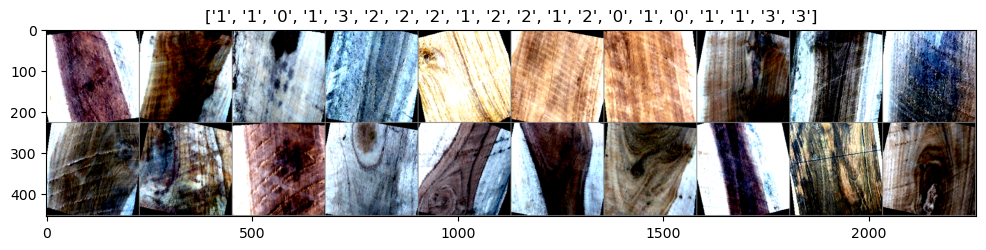

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample images of Validation Dataset


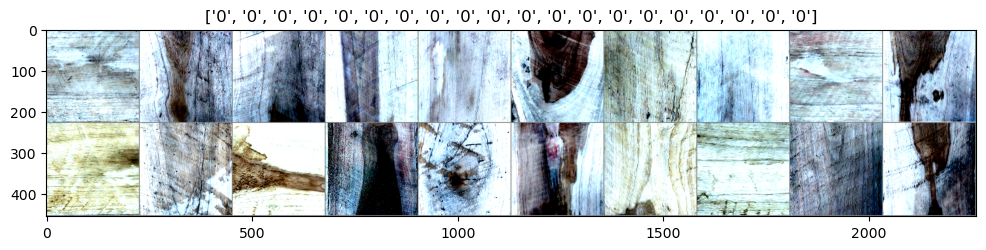

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Sample images of Test Dataset


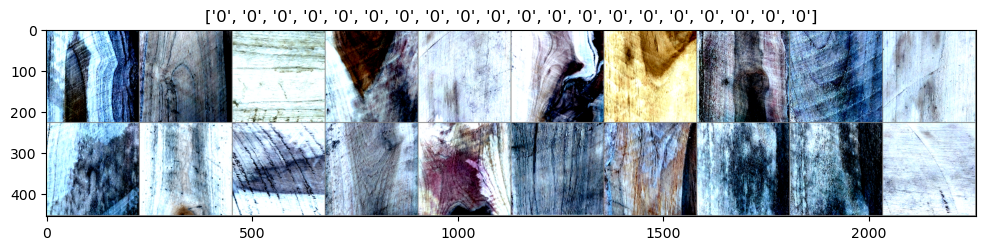

In [57]:
print('Sample images of Train Dataset')
display_sample_images(final_train_loader,class_names)

print('Sample images of Validation Dataset')
display_sample_images(val_loader,class_names)

print('Sample images of Test Dataset')
display_sample_images(test_loader,class_names)

# Model Development and Optimization

In [58]:
# Common parameter values and generic functions
image_datasets = {
    'train': final_train_dataset,
    'validation': val_dataset
}

dataloaders = {
    'train': final_train_loader,
    'validation': val_loader
}

is_loading_saved_model = True
is_model_training = True # This is set False at the end of the exercise to avoid the trianing

# Define the device to execute the Model
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def visualize_performance():
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Plot the training and test loss on the first subplot (ax1)
    ax1.plot(train_loss_history, label='Train Loss')
    ax1.plot(val_loss_history, label='Validation Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.set_title('Loss vs Epoch')

    # Plot the training and test accuracy on the second subplot (ax2)
    ax2.plot(train_acc_history, label='Train Accuracy')
    ax2.plot(val_acc_history, label='Validation Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    ax2.set_title('Accuracy vs Epoch')

    # Display the plots
    plt.tight_layout()
    plt.show()

## Baseline CNN Model Implementation and Evaluation

### CNN Model

In [59]:
class TeakGradeCNNBaseline(nn.Module):
    def __init__(self, num_classes=4):
        super(TeakGradeCNNBaseline, self).__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.fc1 = nn.Linear(256 * 14 * 14, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = self.pool(F.relu(self.conv4(x)))

        x = x.view(-1, 256 * 14 * 14)  # Flatten the output for the fully connected layers

        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        
        return x

# Initialize the CNN model and transferr it to the device
model = TeakGradeCNNBaseline(num_classes=4).to(device)

### Loss Function and Optimizer Initialization

In [60]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

### Model Training and Validation

In [61]:
train_loss_history = []
val_loss_history = []
train_acc_history = []
val_acc_history = []

def train_model_v1(model, criterion, optimizer, dataloaders,image_datasets,num_epochs=5):
    
    dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation']} # Dataset sizes
    best_model_wts = model.state_dict()
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            
            with tqdm(dataloaders[phase], desc=f"{phase.capitalize()} Progress", unit="batch") as pbar: # Progress bar
                for inputs, labels in pbar:
                    inputs = inputs.to(device)
                    labels = labels.to(device)
                    optimizer.zero_grad() # Zero the parameter gradients

                    # Forward pass
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        # Backward pass and optimize only in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()
                            
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                    # Update progress bar description
                    pbar.set_postfix(loss=loss.item(), acc=running_corrects.double() / ((pbar.n + 1) * inputs.size(0)))

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            
            if phase == 'train':
                train_loss_history.append(epoch_loss)
                train_acc_history.append(epoch_acc)
            else:
                val_loss_history.append(epoch_loss)
                val_acc_history.append(epoch_acc)

            print(f'{phase} Loss: {epoch_loss:.4f} Accuracy: {epoch_acc:.4f}')

            # Keep track of best accuracy and best model weights
            if phase == 'validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

    model.load_state_dict(best_model_wts) # Load best model weights
    return model

if is_model_training:
    print ("Model training is started - baseline")
    model = train_model_v1(model, criterion, optimizer,dataloaders,image_datasets,num_epochs=25)
    print ("Model training is completed")
    # Saving the final model parameters
    best_model_wts = model.state_dict()
    torch.save(best_model_wts, 'best_model_wts_baseline.pth')
else:
    print ("Model training is disabled")

Model training is started - baseline
Epoch 1/25
----------


Train Progress: 100%|█████████| 150/150 [05:28<00:00,  2.19s/batch, acc=tensor(0.7287, dtype=torch.float64), loss=1.37]


train Loss: 1.3732 Accuracy: 0.2972


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.04batch/s, acc=tensor(0.5119, dtype=torch.float64), loss=1.46]


validation Loss: 1.3308 Accuracy: 0.4542
Epoch 2/25
----------


Train Progress: 100%|█████████| 150/150 [05:38<00:00,  2.26s/batch, acc=tensor(1.1436, dtype=torch.float64), loss=1.26]


train Loss: 1.2142 Accuracy: 0.4664


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.07batch/s, acc=tensor(0.6270, dtype=torch.float64), loss=1.45]


validation Loss: 1.0086 Accuracy: 0.5563
Epoch 3/25
----------


Train Progress: 100%|████████| 150/150 [05:36<00:00,  2.24s/batch, acc=tensor(1.5862, dtype=torch.float64), loss=0.932]


train Loss: 0.8616 Accuracy: 0.6469


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.01batch/s, acc=tensor(0.8056, dtype=torch.float64), loss=1.41]


validation Loss: 0.7506 Accuracy: 0.7148
Epoch 4/25
----------


Train Progress: 100%|████████| 150/150 [05:42<00:00,  2.29s/batch, acc=tensor(1.7287, dtype=torch.float64), loss=0.577]


train Loss: 0.7466 Accuracy: 0.7051


Validation Progress: 100%|█████████| 9/9 [00:09<00:00,  1.04s/batch, acc=tensor(0.7738, dtype=torch.float64), loss=1.3]


validation Loss: 0.7126 Accuracy: 0.6866
Epoch 5/25
----------


Train Progress: 100%|████████| 150/150 [05:42<00:00,  2.29s/batch, acc=tensor(1.8087, dtype=torch.float64), loss=0.764]


train Loss: 0.6674 Accuracy: 0.7377


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.03batch/s, acc=tensor(0.7778, dtype=torch.float64), loss=1.48]


validation Loss: 0.6988 Accuracy: 0.6901
Epoch 6/25
----------


Train Progress: 100%|████████| 150/150 [05:50<00:00,  2.34s/batch, acc=tensor(1.8477, dtype=torch.float64), loss=0.611]


train Loss: 0.6211 Accuracy: 0.7536


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.05batch/s, acc=tensor(0.8452, dtype=torch.float64), loss=1.49]


validation Loss: 0.6348 Accuracy: 0.7500
Epoch 7/25
----------


Train Progress: 100%|████████| 150/150 [05:43<00:00,  2.29s/batch, acc=tensor(1.8826, dtype=torch.float64), loss=0.759]


train Loss: 0.5992 Accuracy: 0.7678


Validation Progress: 100%|█████████| 9/9 [00:08<00:00,  1.05batch/s, acc=tensor(0.8532, dtype=torch.float64), loss=1.3]


validation Loss: 0.6050 Accuracy: 0.7570
Epoch 8/25
----------


Train Progress: 100%|████████| 150/150 [05:40<00:00,  2.27s/batch, acc=tensor(1.9205, dtype=torch.float64), loss=0.582]


train Loss: 0.5609 Accuracy: 0.7833


Validation Progress: 100%|███████| 9/9 [00:08<00:00,  1.03batch/s, acc=tensor(0.8810, dtype=torch.float64), loss=0.959]


validation Loss: 0.5677 Accuracy: 0.7817
Epoch 9/25
----------


Train Progress: 100%|████████| 150/150 [05:43<00:00,  2.29s/batch, acc=tensor(1.9308, dtype=torch.float64), loss=0.528]


train Loss: 0.5366 Accuracy: 0.7875


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.02batch/s, acc=tensor(0.8135, dtype=torch.float64), loss=1.85]


validation Loss: 0.7253 Accuracy: 0.7218
Epoch 10/25
----------


Train Progress: 100%|████████| 150/150 [05:40<00:00,  2.27s/batch, acc=tensor(1.9713, dtype=torch.float64), loss=0.492]


train Loss: 0.5023 Accuracy: 0.8040


Validation Progress: 100%|███████| 9/9 [00:08<00:00,  1.05batch/s, acc=tensor(0.8849, dtype=torch.float64), loss=0.933]


validation Loss: 0.5699 Accuracy: 0.7852
Epoch 11/25
----------


Train Progress: 100%|████████| 150/150 [05:44<00:00,  2.30s/batch, acc=tensor(1.9938, dtype=torch.float64), loss=0.797]


train Loss: 0.4835 Accuracy: 0.8132


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.09s/batch, acc=tensor(0.8849, dtype=torch.float64), loss=1.02]


validation Loss: 0.5307 Accuracy: 0.7852
Epoch 12/25
----------


Train Progress: 100%|████████| 150/150 [05:43<00:00,  2.29s/batch, acc=tensor(1.9964, dtype=torch.float64), loss=0.809]


train Loss: 0.4745 Accuracy: 0.8143


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.02batch/s, acc=tensor(0.8770, dtype=torch.float64), loss=1.19]


validation Loss: 0.5518 Accuracy: 0.7782
Epoch 13/25
----------


Train Progress: 100%|████████| 150/150 [05:42<00:00,  2.28s/batch, acc=tensor(2.0159, dtype=torch.float64), loss=0.686]


train Loss: 0.4508 Accuracy: 0.8222


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.02batch/s, acc=tensor(0.8730, dtype=torch.float64), loss=1.08]


validation Loss: 0.5415 Accuracy: 0.7746
Epoch 14/25
----------


Train Progress: 100%|████████| 150/150 [05:48<00:00,  2.32s/batch, acc=tensor(2.0533, dtype=torch.float64), loss=0.362]


train Loss: 0.4232 Accuracy: 0.8375


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.01batch/s, acc=tensor(0.8810, dtype=torch.float64), loss=1.42]


validation Loss: 0.6053 Accuracy: 0.7817
Epoch 15/25
----------


Train Progress: 100%|████████| 150/150 [05:57<00:00,  2.39s/batch, acc=tensor(2.0728, dtype=torch.float64), loss=0.399]


train Loss: 0.3972 Accuracy: 0.8454


Validation Progress: 100%|█████████| 9/9 [00:09<00:00,  1.05s/batch, acc=tensor(0.8889, dtype=torch.float64), loss=1.2]


validation Loss: 0.5438 Accuracy: 0.7887
Epoch 16/25
----------


Train Progress: 100%|████████| 150/150 [05:49<00:00,  2.33s/batch, acc=tensor(2.0821, dtype=torch.float64), loss=0.229]


train Loss: 0.3890 Accuracy: 0.8492


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.05batch/s, acc=tensor(0.8770, dtype=torch.float64), loss=1.87]


validation Loss: 0.6443 Accuracy: 0.7782
Epoch 17/25
----------


Train Progress: 100%|████████| 150/150 [05:42<00:00,  2.28s/batch, acc=tensor(2.1046, dtype=torch.float64), loss=0.446]


train Loss: 0.3684 Accuracy: 0.8584


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.02s/batch, acc=tensor(0.8452, dtype=torch.float64), loss=1.67]


validation Loss: 0.6853 Accuracy: 0.7500
Epoch 18/25
----------


Train Progress: 100%|█████████| 150/150 [05:50<00:00,  2.34s/batch, acc=tensor(2.1010, dtype=torch.float64), loss=0.22]


train Loss: 0.3636 Accuracy: 0.8569


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.01batch/s, acc=tensor(0.9048, dtype=torch.float64), loss=1.06]


validation Loss: 0.5558 Accuracy: 0.8028
Epoch 19/25
----------


Train Progress: 100%|████████| 150/150 [06:12<00:00,  2.48s/batch, acc=tensor(2.1544, dtype=torch.float64), loss=0.284]


train Loss: 0.3277 Accuracy: 0.8787


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.11s/batch, acc=tensor(0.8810, dtype=torch.float64), loss=1.36]


validation Loss: 0.5982 Accuracy: 0.7817
Epoch 20/25
----------


Train Progress: 100%|████████| 150/150 [06:19<00:00,  2.53s/batch, acc=tensor(2.1400, dtype=torch.float64), loss=0.298]


train Loss: 0.3343 Accuracy: 0.8728


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.20s/batch, acc=tensor(0.8651, dtype=torch.float64), loss=1.53]


validation Loss: 0.6433 Accuracy: 0.7676
Epoch 21/25
----------


Train Progress: 100%|████████| 150/150 [06:01<00:00,  2.41s/batch, acc=tensor(2.1590, dtype=torch.float64), loss=0.265]


train Loss: 0.3097 Accuracy: 0.8806


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.00batch/s, acc=tensor(0.8532, dtype=torch.float64), loss=1.74]


validation Loss: 0.7093 Accuracy: 0.7570
Epoch 22/25
----------


Train Progress: 100%|█████████| 150/150 [06:15<00:00,  2.50s/batch, acc=tensor(2.1918, dtype=torch.float64), loss=0.19]


train Loss: 0.2802 Accuracy: 0.8940


Validation Progress: 100%|████████| 9/9 [00:11<00:00,  1.23s/batch, acc=tensor(0.8929, dtype=torch.float64), loss=1.51]


validation Loss: 0.6285 Accuracy: 0.7923
Epoch 23/25
----------


Train Progress: 100%|████████| 150/150 [06:11<00:00,  2.48s/batch, acc=tensor(2.1985, dtype=torch.float64), loss=0.136]


train Loss: 0.2752 Accuracy: 0.8967


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.20s/batch, acc=tensor(0.8929, dtype=torch.float64), loss=1.55]


validation Loss: 0.6238 Accuracy: 0.7923
Epoch 24/25
----------


Train Progress: 100%|███████| 150/150 [05:21<00:00,  2.14s/batch, acc=tensor(2.1985, dtype=torch.float64), loss=0.0684]


train Loss: 0.2734 Accuracy: 0.8967


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.05s/batch, acc=tensor(0.9127, dtype=torch.float64), loss=1.46]


validation Loss: 0.6226 Accuracy: 0.8099
Epoch 25/25
----------


Train Progress: 100%|████████| 150/150 [05:19<00:00,  2.13s/batch, acc=tensor(2.2087, dtype=torch.float64), loss=0.442]


train Loss: 0.2488 Accuracy: 0.9009


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.11batch/s, acc=tensor(0.8810, dtype=torch.float64), loss=1.59]


validation Loss: 0.6460 Accuracy: 0.7817
Model training is completed


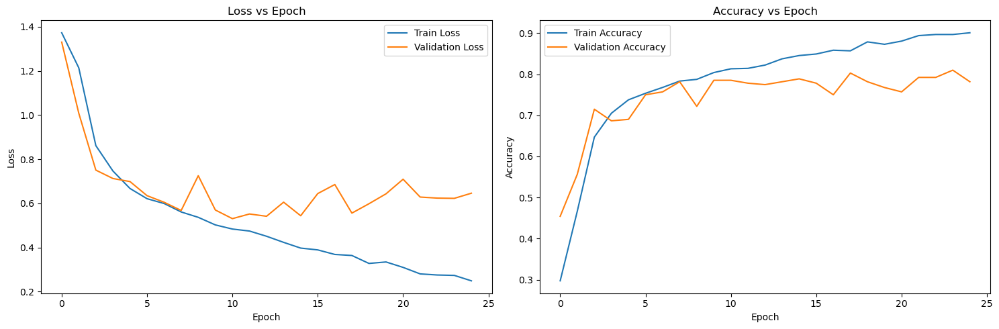

In [62]:
visualize_performance()

### Model Evaluation

In [65]:
def evaluate_model(model, criterion, test_dataloader):
    model.eval()  # Set the model to evaluation mode
    running_loss = 0.0
    running_corrects = 0
    all_preds = []
    all_labels = []
    
    test_dataset_size = len(test_dataloader.dataset)

    # Disable gradient calculations for evaluation
    with torch.no_grad():
        # Iterate over the test data with a progress bar
        with tqdm(test_dataloader, desc="Test Progress", unit="batch") as pbar:
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Forward pass (no gradient calculation in eval mode)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                # Collect predictions and true labels
                all_preds.extend(preds.cpu().numpy())  # Convert to CPU and NumPy for compatibility
                all_labels.extend(labels.cpu().numpy())

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                # Update progress bar with current loss and accuracy
                pbar.set_postfix(loss=loss.item(), acc=running_corrects.double() / ((pbar.n + 1) * inputs.size(0)))

    # Calculate the overall loss and accuracy
    test_loss = running_loss / test_dataset_size
    test_acc = running_corrects.double() / test_dataset_size

    return test_loss, test_acc, all_labels, all_preds

In [66]:
# Model Evaluation with test dataset
test_loss, test_acc, all_labels, all_preds = evaluate_model(model, criterion, test_loader)

Test Progress: 100%|██████████████| 9/9 [00:08<00:00,  1.11batch/s, acc=tensor(0.8690, dtype=torch.float64), loss=1.18]


In [67]:
# Model Loss and Accuracy Values
print(f'Test Loss: {test_loss:.4f}')
print(f'Accuracy: {test_acc:.4f}')

Test Loss: 0.7171
Accuracy: 0.7711


In [69]:
# Classification Report
print('Classification Report:')
print(classification_report(all_labels, all_preds, target_names=class_names))

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.69      0.76        49
           1       0.70      0.77      0.73        57
           2       0.77      0.89      0.82       124
           3       0.84      0.57      0.68        54

    accuracy                           0.77       284
   macro avg       0.78      0.73      0.75       284
weighted avg       0.78      0.77      0.77       284



In [70]:
# Comparing Actual with Predicted values using Confusion matrix
def plot_confusion_matrix(all_labels, all_preds):
    cm = confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

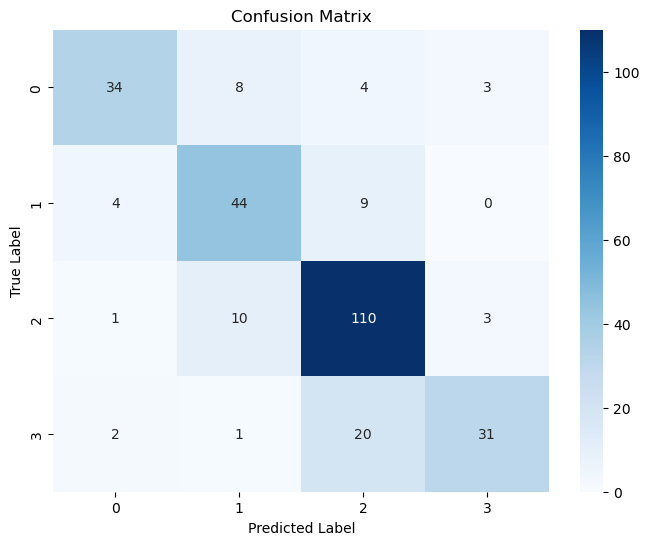

In [71]:
plot_confusion_matrix(all_labels, all_preds)

## Optimized CNN Model Implementation and Evaluation (1st Iteration)

### CNN Model

In [72]:
class TeakGradeCNNOptimized1(nn.Module):
    def __init__(self, num_classes=4):
        super(TeakGradeCNNOptimized1, self).__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.fc1 = nn.Linear(256 * 14 * 14, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, num_classes)

        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = self.pool(F.relu(self.conv4(x)))

        x = x.view(-1, 256 * 14 * 14)  # Flatten the output for the fully connected layers

        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        
        return x

# Initialize the CNN model and transferr it to the device
model = TeakGradeCNNOptimized1(num_classes=4).to(device)

### Loss Function and Optimizer Initialization

In [73]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

### Model Training and Validation

In [74]:
train_loss_history = []
val_loss_history = []
train_acc_history = []
val_acc_history = []

if is_model_training:
    print ("Model training is started - optimization stage 1 ")
    model = train_model_v1(model, criterion, optimizer,dataloaders,image_datasets,num_epochs=25)
    print ("Model training is completed")
    # Saving the final model parameters
    best_model_wts = model.state_dict()
    torch.save(best_model_wts, 'best_model_wts_optimized_1.pth')
else:
    print ("Model training is disabled")

Model training is started - optimization stage 1 
Epoch 1/25
----------


Train Progress: 100%|█████████| 150/150 [05:56<00:00,  2.38s/batch, acc=tensor(0.7297, dtype=torch.float64), loss=1.38]


train Loss: 1.3794 Accuracy: 0.2976


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.04s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.43]


validation Loss: 1.3420 Accuracy: 0.4366
Epoch 2/25
----------


Train Progress: 100%|█████████| 150/150 [06:12<00:00,  2.49s/batch, acc=tensor(0.8523, dtype=torch.float64), loss=1.14]


train Loss: 1.3191 Accuracy: 0.3476


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.3492, dtype=torch.float64), loss=1.72]


validation Loss: 1.2197 Accuracy: 0.3099
Epoch 3/25
----------


Train Progress: 100%|████████| 150/150 [07:37<00:00,  3.05s/batch, acc=tensor(1.1723, dtype=torch.float64), loss=0.768]


train Loss: 1.1296 Accuracy: 0.4781


Validation Progress: 100%|████████| 9/9 [00:14<00:00,  1.59s/batch, acc=tensor(0.7183, dtype=torch.float64), loss=1.46]


validation Loss: 0.8974 Accuracy: 0.6373
Epoch 4/25
----------


Train Progress: 100%|████████| 150/150 [08:45<00:00,  3.50s/batch, acc=tensor(1.5569, dtype=torch.float64), loss=0.711]


train Loss: 0.8859 Accuracy: 0.6350


Validation Progress: 100%|████████| 9/9 [00:13<00:00,  1.50s/batch, acc=tensor(0.7897, dtype=torch.float64), loss=1.02]


validation Loss: 0.7561 Accuracy: 0.7007
Epoch 5/25
----------


Train Progress: 100%|████████| 150/150 [09:29<00:00,  3.80s/batch, acc=tensor(1.6744, dtype=torch.float64), loss=0.536]


train Loss: 0.7818 Accuracy: 0.6829


Validation Progress: 100%|████████| 9/9 [00:22<00:00,  2.46s/batch, acc=tensor(0.7222, dtype=torch.float64), loss=1.29]


validation Loss: 0.8481 Accuracy: 0.6408
Epoch 6/25
----------


Train Progress: 100%|████████| 150/150 [06:03<00:00,  2.42s/batch, acc=tensor(1.7569, dtype=torch.float64), loss=0.788]


train Loss: 0.7228 Accuracy: 0.7166


Validation Progress: 100%|███████| 9/9 [00:09<00:00,  1.02s/batch, acc=tensor(0.8452, dtype=torch.float64), loss=0.612]


validation Loss: 0.6447 Accuracy: 0.7500
Epoch 7/25
----------


Train Progress: 100%|████████| 150/150 [05:51<00:00,  2.35s/batch, acc=tensor(1.7810, dtype=torch.float64), loss=0.667]


train Loss: 0.7017 Accuracy: 0.7264


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.01batch/s, acc=tensor(0.7460, dtype=torch.float64), loss=1.44]


validation Loss: 0.7568 Accuracy: 0.6620
Epoch 8/25
----------


Train Progress: 100%|████████| 150/150 [06:04<00:00,  2.43s/batch, acc=tensor(1.8026, dtype=torch.float64), loss=0.703]


train Loss: 0.6640 Accuracy: 0.7352


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.17s/batch, acc=tensor(0.7937, dtype=torch.float64), loss=1.32]


validation Loss: 0.7255 Accuracy: 0.7042
Epoch 9/25
----------


Train Progress: 100%|████████| 150/150 [06:04<00:00,  2.43s/batch, acc=tensor(1.8179, dtype=torch.float64), loss=0.588]


train Loss: 0.6569 Accuracy: 0.7415


Validation Progress: 100%|████████| 9/9 [00:11<00:00,  1.24s/batch, acc=tensor(0.8571, dtype=torch.float64), loss=1.38]


validation Loss: 0.6742 Accuracy: 0.7606
Epoch 10/25
----------


Train Progress: 100%|████████| 150/150 [05:56<00:00,  2.38s/batch, acc=tensor(1.8636, dtype=torch.float64), loss=0.738]


train Loss: 0.6192 Accuracy: 0.7601


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.02s/batch, acc=tensor(0.8532, dtype=torch.float64), loss=1.38]


validation Loss: 0.6429 Accuracy: 0.7570
Epoch 11/25
----------


Train Progress: 100%|████████| 150/150 [05:52<00:00,  2.35s/batch, acc=tensor(1.8769, dtype=torch.float64), loss=0.626]


train Loss: 0.5986 Accuracy: 0.7655


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.8810, dtype=torch.float64), loss=1.03]


validation Loss: 0.5787 Accuracy: 0.7817
Epoch 12/25
----------


Train Progress: 100%|████████| 150/150 [05:49<00:00,  2.33s/batch, acc=tensor(1.8882, dtype=torch.float64), loss=0.437]


train Loss: 0.5926 Accuracy: 0.7701


Validation Progress: 100%|███████| 9/9 [00:09<00:00,  1.01s/batch, acc=tensor(0.8770, dtype=torch.float64), loss=0.991]


validation Loss: 0.5869 Accuracy: 0.7782
Epoch 13/25
----------


Train Progress: 100%|█████████| 150/150 [05:41<00:00,  2.28s/batch, acc=tensor(1.9185, dtype=torch.float64), loss=0.96]


train Loss: 0.5608 Accuracy: 0.7825


Validation Progress: 100%|███████| 9/9 [00:09<00:00,  1.08s/batch, acc=tensor(0.8690, dtype=torch.float64), loss=0.718]


validation Loss: 0.5704 Accuracy: 0.7711
Epoch 14/25
----------


Train Progress: 100%|█████████| 150/150 [05:43<00:00,  2.29s/batch, acc=tensor(1.9246, dtype=torch.float64), loss=0.65]


train Loss: 0.5577 Accuracy: 0.7850


Validation Progress: 100%|███████| 9/9 [00:10<00:00,  1.17s/batch, acc=tensor(0.8810, dtype=torch.float64), loss=0.761]


validation Loss: 0.5783 Accuracy: 0.7817
Epoch 15/25
----------


Train Progress: 100%|████████| 150/150 [05:46<00:00,  2.31s/batch, acc=tensor(1.9272, dtype=torch.float64), loss=0.554]


train Loss: 0.5497 Accuracy: 0.7860


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.00batch/s, acc=tensor(0.7976, dtype=torch.float64), loss=1.27]


validation Loss: 0.6827 Accuracy: 0.7077
Epoch 16/25
----------


Train Progress: 100%|████████| 150/150 [05:40<00:00,  2.27s/batch, acc=tensor(1.9462, dtype=torch.float64), loss=0.934]


train Loss: 0.5366 Accuracy: 0.7938


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.04s/batch, acc=tensor(0.8730, dtype=torch.float64), loss=1.38]


validation Loss: 0.5623 Accuracy: 0.7746
Epoch 17/25
----------


Train Progress: 100%|████████| 150/150 [05:42<00:00,  2.29s/batch, acc=tensor(1.9636, dtype=torch.float64), loss=0.477]


train Loss: 0.5126 Accuracy: 0.8009


Validation Progress: 100%|███████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.8770, dtype=torch.float64), loss=0.955]


validation Loss: 0.5185 Accuracy: 0.7782
Epoch 18/25
----------


Train Progress: 100%|████████| 150/150 [05:36<00:00,  2.24s/batch, acc=tensor(1.9805, dtype=torch.float64), loss=0.351]


train Loss: 0.5088 Accuracy: 0.8078


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.08batch/s, acc=tensor(0.8929, dtype=torch.float64), loss=1.27]


validation Loss: 0.5536 Accuracy: 0.7923
Epoch 19/25
----------


Train Progress: 100%|████████| 150/150 [05:43<00:00,  2.29s/batch, acc=tensor(1.9815, dtype=torch.float64), loss=0.509]


train Loss: 0.4943 Accuracy: 0.8082


Validation Progress: 100%|█████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.8770, dtype=torch.float64), loss=1.3]


validation Loss: 0.5714 Accuracy: 0.7782
Epoch 20/25
----------


Train Progress: 100%|████████| 150/150 [05:45<00:00,  2.30s/batch, acc=tensor(1.9882, dtype=torch.float64), loss=0.617]


train Loss: 0.4875 Accuracy: 0.8109


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.05s/batch, acc=tensor(0.8929, dtype=torch.float64), loss=1.39]


validation Loss: 0.5680 Accuracy: 0.7923
Epoch 21/25
----------


Train Progress: 100%|████████| 150/150 [05:40<00:00,  2.27s/batch, acc=tensor(2.0031, dtype=torch.float64), loss=0.657]


train Loss: 0.4758 Accuracy: 0.8170


Validation Progress: 100%|███████| 9/9 [00:08<00:00,  1.01batch/s, acc=tensor(0.8968, dtype=torch.float64), loss=0.941]


validation Loss: 0.5152 Accuracy: 0.7958
Epoch 22/25
----------


Train Progress: 100%|████████| 150/150 [05:25<00:00,  2.17s/batch, acc=tensor(2.0308, dtype=torch.float64), loss=0.439]


train Loss: 0.4527 Accuracy: 0.8283


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.04batch/s, acc=tensor(0.8968, dtype=torch.float64), loss=1.32]


validation Loss: 0.5449 Accuracy: 0.7958
Epoch 23/25
----------


Train Progress: 100%|████████| 150/150 [05:22<00:00,  2.15s/batch, acc=tensor(2.0292, dtype=torch.float64), loss=0.825]


train Loss: 0.4550 Accuracy: 0.8277


Validation Progress: 100%|█████████| 9/9 [00:08<00:00,  1.00batch/s, acc=tensor(0.8849, dtype=torch.float64), loss=1.1]


validation Loss: 0.5561 Accuracy: 0.7852
Epoch 24/25
----------


Train Progress: 100%|████████| 150/150 [07:25<00:00,  2.97s/batch, acc=tensor(2.0303, dtype=torch.float64), loss=0.349]


train Loss: 0.4376 Accuracy: 0.8281


Validation Progress: 100%|███████| 9/9 [00:09<00:00,  1.09s/batch, acc=tensor(0.8810, dtype=torch.float64), loss=0.944]


validation Loss: 0.5523 Accuracy: 0.7817
Epoch 25/25
----------


Train Progress: 100%|███████| 150/150 [06:17<00:00,  2.52s/batch, acc=tensor(2.0503, dtype=torch.float64), loss=0.0577]


train Loss: 0.4344 Accuracy: 0.8362


Validation Progress: 100%|████████| 9/9 [00:11<00:00,  1.30s/batch, acc=tensor(0.8690, dtype=torch.float64), loss=1.72]


validation Loss: 0.6729 Accuracy: 0.7711
Model training is completed


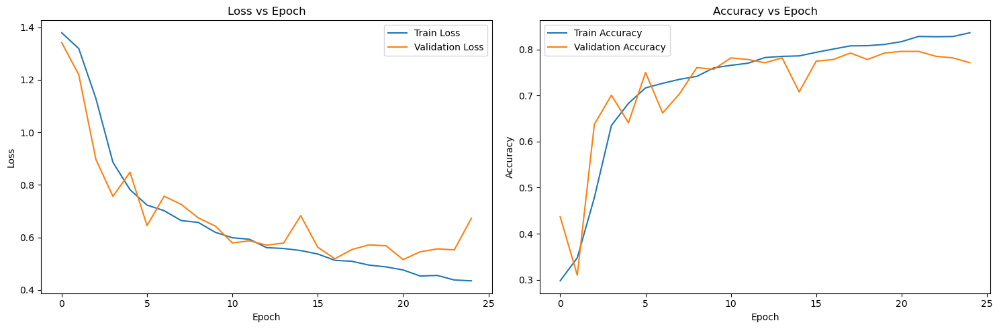

In [75]:
visualize_performance()

### Model Evaluation

In [76]:
# Model Evaluation with test dataset
test_loss, test_acc, all_labels, all_preds = evaluate_model(model, criterion, test_loader)

Test Progress: 100%|██████████████| 9/9 [00:09<00:00,  1.08s/batch, acc=tensor(0.8056, dtype=torch.float64), loss=1.85]


In [77]:
# Model Loss and Accuracy Values
print(f'Test Loss: {test_loss:.4f}')
print(f'Accuracy: {test_acc:.4f}')

Test Loss: 0.7893
Accuracy: 0.7148


In [78]:
# Classification Report
print('Classification Report:')
print(classification_report(all_labels, all_preds, target_names=class_names))

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.67      0.75        49
           1       0.59      0.89      0.71        57
           2       0.74      0.81      0.77       124
           3       0.83      0.35      0.49        54

    accuracy                           0.71       284
   macro avg       0.75      0.68      0.68       284
weighted avg       0.74      0.71      0.70       284



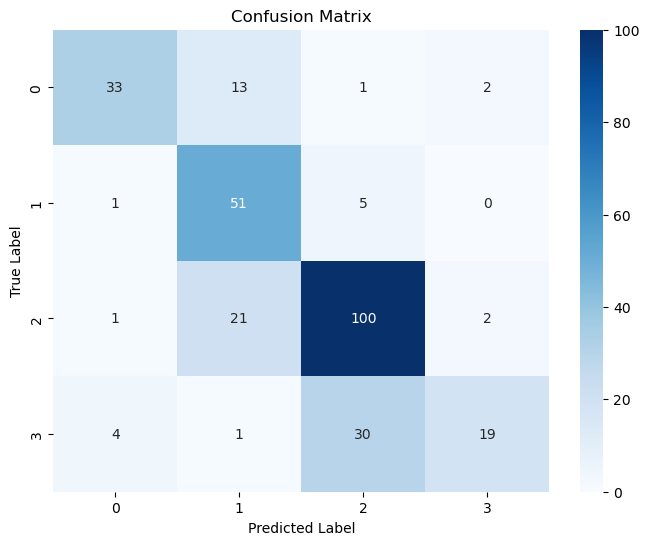

In [79]:
# Comparing Actual with Predicted values using Confusion matrix
plot_confusion_matrix(all_labels, all_preds)

## Optimized CNN Model Implementation and Evaluation (2nd Iteration)

In [93]:
class TeakGradeCNNOptimized2(nn.Module):
    def __init__(self, num_classes=5):
        super(TeakGradeCNNOptimized2, self).__init__()

        # Convolutional layers with Batch Normalization
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(32)  # Batch normalization after conv1
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(64)  # Batch normalization after conv2
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(128)  # Batch normalization after conv3
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(256)  # Batch normalization after conv4

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Fully connected layers
        self.fc1 = nn.Linear(256 * 14 * 14, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, num_classes)

        self.dropout = nn.Dropout(0.4)

    def forward(self, x):
        # Convolutional layers with batch normalization and ReLU
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))

        # Flatten the output
        x = x.view(-1, 256 * 14 * 14)  # Flatten the output for the fully connected layers

        # Fully connected layers with ReLU and Dropout
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)

        return x

# Initialize the CNN model and transferr it to the device
model = TeakGradeCNNOptimized2(num_classes=4).to(device)

### Loss Function and Optimizer Initialization

In [94]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Learning rate scheduler to reduce the learning rate when a metric has stopped improving
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

### Model Training and Validation

In [95]:
train_loss_history = []
val_loss_history = []
train_acc_history = []
val_acc_history = []

def train_model_v2(model, criterion, optimizer, dataloaders,image_datasets,scheduler,num_epochs=5):
    
    dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation']} # Dataset sizes
    best_model_wts = model.state_dict()
    best_acc = 0.0

    flag = False
    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'validation']: # Each epoch has a training and validation phase
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data with progress bar
            with tqdm(dataloaders[phase], desc=f"{phase.capitalize()} Progress", unit="batch") as pbar:
                for inputs, labels in pbar:
                    inputs = inputs.to(device)
                    labels = labels.to(device)
                    optimizer.zero_grad() # Zero the parameter gradients
                    with torch.set_grad_enabled(phase == 'train'): # Forward pass
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        if phase == 'train': # Backward pass and optimize only in training phase
                            loss.backward()
                            optimizer.step()
                            
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                    pbar.set_postfix(loss=loss.item(), acc=running_corrects.double() / ((pbar.n + 1) * inputs.size(0)))
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            
            if phase == 'validation':
                scheduler.step(epoch_loss)
            
            if phase == 'train':
                train_loss_history.append(epoch_loss)
                train_acc_history.append(epoch_acc)
            else:
                val_loss_history.append(epoch_loss)
                val_acc_history.append(epoch_acc)

            print(f'{phase} Loss: {epoch_loss:.4f} Accuracy: {epoch_acc:.4f}')

            if phase == 'validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()
        if flag:
            break
    # Load best model weights
    model.load_state_dict(best_model_wts)
    return model

if is_model_training:
    print ("Model training is started - optimization stage 2")
    model = train_model_v2(model, criterion, optimizer,dataloaders,image_datasets,scheduler,num_epochs=40)
    print ("Model training is completed")
    # Saving the final model parameters
    best_model_wts = model.state_dict()
    torch.save(best_model_wts, 'best_model_wts_optimized_2.pth')
else:
    print ("Model training is disabled")

Model training is started - optimization stage 2
Epoch 1/40
----------


Train Progress: 100%|█████████| 150/150 [07:22<00:00,  2.95s/batch, acc=tensor(1.2744, dtype=torch.float64), loss=1.03]


train Loss: 1.7821 Accuracy: 0.5198


Validation Progress: 100%|███████| 9/9 [00:11<00:00,  1.27s/batch, acc=tensor(0.7063, dtype=torch.float64), loss=0.979]


validation Loss: 0.8063 Accuracy: 0.6268
Epoch 2/40
----------


Train Progress: 100%|████████| 150/150 [07:22<00:00,  2.95s/batch, acc=tensor(1.5877, dtype=torch.float64), loss=0.401]


train Loss: 0.8831 Accuracy: 0.6476


Validation Progress: 100%|███████| 9/9 [00:10<00:00,  1.12s/batch, acc=tensor(0.8056, dtype=torch.float64), loss=0.688]


validation Loss: 0.7078 Accuracy: 0.7148
Epoch 3/40
----------


Train Progress: 100%|████████| 150/150 [07:15<00:00,  2.91s/batch, acc=tensor(1.6846, dtype=torch.float64), loss=0.626]


train Loss: 0.7818 Accuracy: 0.6871


Validation Progress: 100%|███████| 9/9 [00:09<00:00,  1.09s/batch, acc=tensor(0.7778, dtype=torch.float64), loss=0.615]


validation Loss: 0.7157 Accuracy: 0.6901
Epoch 4/40
----------


Train Progress: 100%|████████| 150/150 [07:21<00:00,  2.94s/batch, acc=tensor(1.7697, dtype=torch.float64), loss=0.426]


train Loss: 0.7227 Accuracy: 0.7218


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.8016, dtype=torch.float64), loss=1.05]


validation Loss: 0.7050 Accuracy: 0.7113
Epoch 5/40
----------


Train Progress: 100%|████████| 150/150 [07:07<00:00,  2.85s/batch, acc=tensor(1.8395, dtype=torch.float64), loss=0.332]


train Loss: 0.6657 Accuracy: 0.7503


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.04s/batch, acc=tensor(0.8373, dtype=torch.float64), loss=1.11]


validation Loss: 0.6604 Accuracy: 0.7430
Epoch 6/40
----------


Train Progress: 100%|████████| 150/150 [07:17<00:00,  2.92s/batch, acc=tensor(1.8462, dtype=torch.float64), loss=0.815]


train Loss: 0.6357 Accuracy: 0.7530


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.09s/batch, acc=tensor(0.8651, dtype=torch.float64), loss=1.31]


validation Loss: 0.5875 Accuracy: 0.7676
Epoch 7/40
----------


Train Progress: 100%|████████| 150/150 [07:30<00:00,  3.00s/batch, acc=tensor(1.8779, dtype=torch.float64), loss=0.637]


train Loss: 0.6134 Accuracy: 0.7659


Validation Progress: 100%|█████████| 9/9 [00:09<00:00,  1.06s/batch, acc=tensor(0.8849, dtype=torch.float64), loss=1.2]


validation Loss: 0.6087 Accuracy: 0.7852
Epoch 8/40
----------


Train Progress: 100%|████████| 150/150 [07:34<00:00,  3.03s/batch, acc=tensor(1.9062, dtype=torch.float64), loss=0.488]


train Loss: 0.5841 Accuracy: 0.7775


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.01batch/s, acc=tensor(0.8492, dtype=torch.float64), loss=0.61]


validation Loss: 0.6620 Accuracy: 0.7535
Epoch 9/40
----------


Train Progress: 100%|████████| 150/150 [07:11<00:00,  2.88s/batch, acc=tensor(1.9426, dtype=torch.float64), loss=0.532]


train Loss: 0.5755 Accuracy: 0.7923


Validation Progress: 100%|███████| 9/9 [00:09<00:00,  1.07s/batch, acc=tensor(0.9087, dtype=torch.float64), loss=0.847]


validation Loss: 0.5525 Accuracy: 0.8063
Epoch 10/40
----------


Train Progress: 100%|████████| 150/150 [07:09<00:00,  2.86s/batch, acc=tensor(1.9313, dtype=torch.float64), loss=0.286]


train Loss: 0.5648 Accuracy: 0.7877


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.03batch/s, acc=tensor(0.8968, dtype=torch.float64), loss=1.12]


validation Loss: 0.5722 Accuracy: 0.7958
Epoch 11/40
----------


Train Progress: 100%|████████| 150/150 [07:18<00:00,  2.93s/batch, acc=tensor(1.9687, dtype=torch.float64), loss=0.446]


train Loss: 0.5265 Accuracy: 0.8030


Validation Progress: 100%|███████| 9/9 [00:11<00:00,  1.30s/batch, acc=tensor(0.8929, dtype=torch.float64), loss=0.861]


validation Loss: 0.5261 Accuracy: 0.7923
Epoch 12/40
----------


Train Progress: 100%|████████| 150/150 [08:14<00:00,  3.29s/batch, acc=tensor(2.0021, dtype=torch.float64), loss=0.494]


train Loss: 0.4990 Accuracy: 0.8166


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.16s/batch, acc=tensor(0.8651, dtype=torch.float64), loss=1.28]


validation Loss: 0.6359 Accuracy: 0.7676
Epoch 13/40
----------


Train Progress: 100%|████████| 150/150 [07:51<00:00,  3.14s/batch, acc=tensor(2.0179, dtype=torch.float64), loss=0.816]


train Loss: 0.4787 Accuracy: 0.8230


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.15s/batch, acc=tensor(0.8690, dtype=torch.float64), loss=1.28]


validation Loss: 0.6587 Accuracy: 0.7711
Epoch 14/40
----------


Train Progress: 100%|█████████| 150/150 [08:18<00:00,  3.32s/batch, acc=tensor(2.0410, dtype=torch.float64), loss=1.03]


train Loss: 0.4619 Accuracy: 0.8325


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.19s/batch, acc=tensor(0.8651, dtype=torch.float64), loss=1.79]


validation Loss: 0.7069 Accuracy: 0.7676
Epoch 15/40
----------


Train Progress: 100%|████████| 150/150 [08:22<00:00,  3.35s/batch, acc=tensor(2.0385, dtype=torch.float64), loss=0.415]


train Loss: 0.4650 Accuracy: 0.8314


Validation Progress: 100%|███████| 9/9 [00:10<00:00,  1.20s/batch, acc=tensor(0.9206, dtype=torch.float64), loss=0.942]


validation Loss: 0.5604 Accuracy: 0.8169
Epoch 16/40
----------


Train Progress: 100%|████████| 150/150 [07:45<00:00,  3.10s/batch, acc=tensor(2.0703, dtype=torch.float64), loss=0.388]


train Loss: 0.4132 Accuracy: 0.8444


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.9365, dtype=torch.float64), loss=1.04]


validation Loss: 0.5752 Accuracy: 0.8310
Epoch 17/40
----------


Train Progress: 100%|████████| 150/150 [07:20<00:00,  2.94s/batch, acc=tensor(2.0938, dtype=torch.float64), loss=0.699]


train Loss: 0.3998 Accuracy: 0.8540


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.8770, dtype=torch.float64), loss=1.13]


validation Loss: 0.6488 Accuracy: 0.7782
Epoch 18/40
----------


Train Progress: 100%|████████| 150/150 [07:03<00:00,  2.83s/batch, acc=tensor(2.1359, dtype=torch.float64), loss=0.141]


train Loss: 0.3383 Accuracy: 0.8712


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.06batch/s, acc=tensor(0.8968, dtype=torch.float64), loss=1.29]


validation Loss: 0.5870 Accuracy: 0.7958
Epoch 19/40
----------


Train Progress: 100%|██████████| 150/150 [06:55<00:00,  2.77s/batch, acc=tensor(2.1692, dtype=torch.float64), loss=0.6]


train Loss: 0.3086 Accuracy: 0.8848


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.05batch/s, acc=tensor(0.9087, dtype=torch.float64), loss=1.28]


validation Loss: 0.5923 Accuracy: 0.8063
Epoch 20/40
----------


Train Progress: 100%|████████| 150/150 [06:53<00:00,  2.76s/batch, acc=tensor(2.1908, dtype=torch.float64), loss=0.486]


train Loss: 0.2812 Accuracy: 0.8935


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.02s/batch, acc=tensor(0.9206, dtype=torch.float64), loss=1.33]


validation Loss: 0.6212 Accuracy: 0.8169
Epoch 21/40
----------


Train Progress: 100%|████████| 150/150 [06:53<00:00,  2.75s/batch, acc=tensor(2.2149, dtype=torch.float64), loss=0.272]


train Loss: 0.2648 Accuracy: 0.9034


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.07s/batch, acc=tensor(0.9087, dtype=torch.float64), loss=1.57]


validation Loss: 0.6619 Accuracy: 0.8063
Epoch 22/40
----------


Train Progress: 100%|████████| 150/150 [07:07<00:00,  2.85s/batch, acc=tensor(2.2226, dtype=torch.float64), loss=0.201]


train Loss: 0.2567 Accuracy: 0.9065


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.02s/batch, acc=tensor(0.9167, dtype=torch.float64), loss=1.62]


validation Loss: 0.6706 Accuracy: 0.8134
Epoch 23/40
----------


Train Progress: 100%|████████| 150/150 [08:22<00:00,  3.35s/batch, acc=tensor(2.2256, dtype=torch.float64), loss=0.419]


train Loss: 0.2574 Accuracy: 0.9078


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.02batch/s, acc=tensor(0.9127, dtype=torch.float64), loss=1.69]


validation Loss: 0.6894 Accuracy: 0.8099
Epoch 24/40
----------


Train Progress: 100%|█████████| 150/150 [07:17<00:00,  2.92s/batch, acc=tensor(2.2369, dtype=torch.float64), loss=0.81]


train Loss: 0.2483 Accuracy: 0.9124


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.17s/batch, acc=tensor(0.9286, dtype=torch.float64), loss=1.63]


validation Loss: 0.6533 Accuracy: 0.8239
Epoch 25/40
----------


Train Progress: 100%|████████| 150/150 [07:42<00:00,  3.08s/batch, acc=tensor(2.2503, dtype=torch.float64), loss=0.131]


train Loss: 0.2325 Accuracy: 0.9178


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.00s/batch, acc=tensor(0.9365, dtype=torch.float64), loss=1.55]


validation Loss: 0.6515 Accuracy: 0.8310
Epoch 26/40
----------


Train Progress: 100%|████████| 150/150 [07:23<00:00,  2.95s/batch, acc=tensor(2.2421, dtype=torch.float64), loss=0.185]


train Loss: 0.2334 Accuracy: 0.9145


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.04s/batch, acc=tensor(0.9246, dtype=torch.float64), loss=1.62]


validation Loss: 0.6541 Accuracy: 0.8204
Epoch 27/40
----------


Train Progress: 100%|███████| 150/150 [07:20<00:00,  2.93s/batch, acc=tensor(2.2277, dtype=torch.float64), loss=0.0675]


train Loss: 0.2452 Accuracy: 0.9086


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.02s/batch, acc=tensor(0.9286, dtype=torch.float64), loss=1.54]


validation Loss: 0.6390 Accuracy: 0.8239
Epoch 28/40
----------


Train Progress: 100%|███████| 150/150 [07:23<00:00,  2.96s/batch, acc=tensor(2.2482, dtype=torch.float64), loss=0.0137]


train Loss: 0.2294 Accuracy: 0.9170


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.01s/batch, acc=tensor(0.9246, dtype=torch.float64), loss=1.67]


validation Loss: 0.6534 Accuracy: 0.8204
Epoch 29/40
----------


Train Progress: 100%|████████| 150/150 [07:22<00:00,  2.95s/batch, acc=tensor(2.2513, dtype=torch.float64), loss=0.154]


train Loss: 0.2304 Accuracy: 0.9182


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.07s/batch, acc=tensor(0.9365, dtype=torch.float64), loss=1.59]


validation Loss: 0.6469 Accuracy: 0.8310
Epoch 30/40
----------


Train Progress: 100%|███████| 150/150 [07:16<00:00,  2.91s/batch, acc=tensor(2.2287, dtype=torch.float64), loss=0.0586]


train Loss: 0.2440 Accuracy: 0.9090


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.9246, dtype=torch.float64), loss=1.55]


validation Loss: 0.6701 Accuracy: 0.8204
Epoch 31/40
----------


Train Progress: 100%|████████| 150/150 [07:24<00:00,  2.96s/batch, acc=tensor(2.2354, dtype=torch.float64), loss=0.272]


train Loss: 0.2440 Accuracy: 0.9117


Validation Progress: 100%|█████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.9286, dtype=torch.float64), loss=1.5]


validation Loss: 0.6538 Accuracy: 0.8239
Epoch 32/40
----------


Train Progress: 100%|████████| 150/150 [07:19<00:00,  2.93s/batch, acc=tensor(2.2390, dtype=torch.float64), loss=0.232]


train Loss: 0.2370 Accuracy: 0.9132


Validation Progress: 100%|█████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.9206, dtype=torch.float64), loss=1.6]


validation Loss: 0.6613 Accuracy: 0.8169
Epoch 33/40
----------


Train Progress: 100%|████████| 150/150 [07:18<00:00,  2.92s/batch, acc=tensor(2.2359, dtype=torch.float64), loss=0.867]


train Loss: 0.2463 Accuracy: 0.9119


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.01s/batch, acc=tensor(0.9286, dtype=torch.float64), loss=1.58]


validation Loss: 0.6565 Accuracy: 0.8239
Epoch 34/40
----------


Train Progress: 100%|████████| 150/150 [07:21<00:00,  2.94s/batch, acc=tensor(2.2323, dtype=torch.float64), loss=0.444]


train Loss: 0.2520 Accuracy: 0.9105


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.14s/batch, acc=tensor(0.9246, dtype=torch.float64), loss=1.51]


validation Loss: 0.6770 Accuracy: 0.8204
Epoch 35/40
----------


Train Progress: 100%|████████| 150/150 [07:02<00:00,  2.82s/batch, acc=tensor(2.2405, dtype=torch.float64), loss=0.288]


train Loss: 0.2308 Accuracy: 0.9138


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.04batch/s, acc=tensor(0.9365, dtype=torch.float64), loss=1.62]


validation Loss: 0.6459 Accuracy: 0.8310
Epoch 36/40
----------


Train Progress: 100%|████████| 150/150 [06:55<00:00,  2.77s/batch, acc=tensor(2.2446, dtype=torch.float64), loss=0.423]


train Loss: 0.2349 Accuracy: 0.9155


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.00s/batch, acc=tensor(0.9206, dtype=torch.float64), loss=1.64]


validation Loss: 0.6753 Accuracy: 0.8169
Epoch 37/40
----------


Train Progress: 100%|██████████| 150/150 [06:57<00:00,  2.78s/batch, acc=tensor(2.2523, dtype=torch.float64), loss=1.3]


train Loss: 0.2270 Accuracy: 0.9186


Validation Progress: 100%|█████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.9246, dtype=torch.float64), loss=1.6]


validation Loss: 0.6713 Accuracy: 0.8204
Epoch 38/40
----------


Train Progress: 100%|███████| 150/150 [06:55<00:00,  2.77s/batch, acc=tensor(2.2472, dtype=torch.float64), loss=0.0566]


train Loss: 0.2206 Accuracy: 0.9165


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.03batch/s, acc=tensor(0.9286, dtype=torch.float64), loss=1.58]


validation Loss: 0.6442 Accuracy: 0.8239
Epoch 39/40
----------


Train Progress: 100%|████████| 150/150 [06:54<00:00,  2.76s/batch, acc=tensor(2.2559, dtype=torch.float64), loss=0.304]


train Loss: 0.2233 Accuracy: 0.9201


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.03batch/s, acc=tensor(0.9325, dtype=torch.float64), loss=1.57]


validation Loss: 0.6648 Accuracy: 0.8275
Epoch 40/40
----------


Train Progress: 100%|████████| 150/150 [06:57<00:00,  2.78s/batch, acc=tensor(2.2467, dtype=torch.float64), loss=0.238]


train Loss: 0.2300 Accuracy: 0.9163


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.02batch/s, acc=tensor(0.9246, dtype=torch.float64), loss=1.63]


validation Loss: 0.6597 Accuracy: 0.8204
Model training is completed


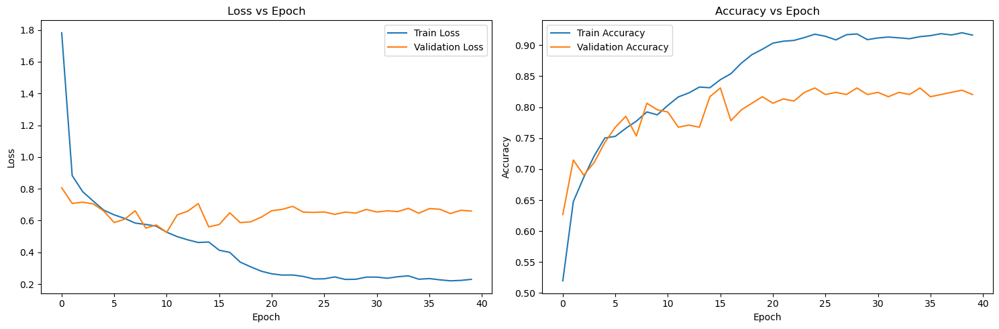

In [96]:
visualize_performance()

### Model Evaluation

In [97]:
# Model Evaluation with test dataset
test_loss, test_acc, all_labels, all_preds = evaluate_model(model, criterion, test_loader)

Test Progress: 100%|██████████████| 9/9 [00:08<00:00,  1.11batch/s, acc=tensor(0.8413, dtype=torch.float64), loss=1.01]


In [98]:
# Model Loss and Accuracy Values
print(f'Test Loss: {test_loss:.4f}')
print(f'Accuracy: {test_acc:.4f}')

Test Loss: 0.6709
Accuracy: 0.7465


In [99]:
# Classification Report
print('Classification Report:')
print(classification_report(all_labels, all_preds, target_names=class_names))

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.73      0.79        49
           1       0.60      0.84      0.70        57
           2       0.78      0.81      0.79       124
           3       0.85      0.52      0.64        54

    accuracy                           0.75       284
   macro avg       0.77      0.73      0.73       284
weighted avg       0.77      0.75      0.74       284



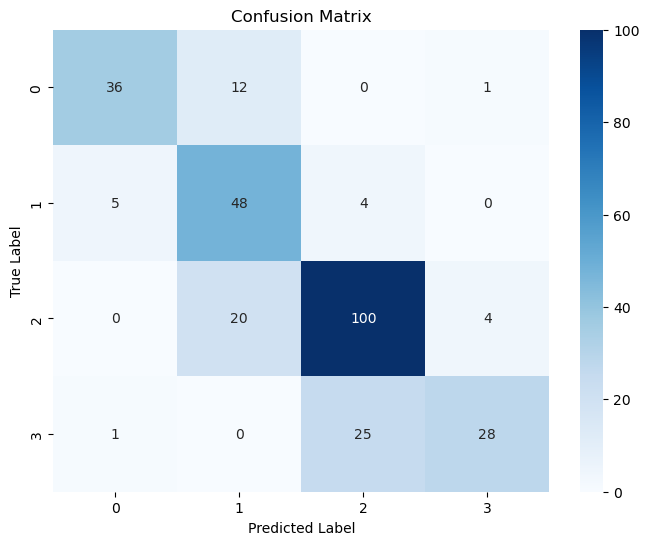

In [100]:
# Comparing Actual with Predicted values using Confusion matrix
plot_confusion_matrix(all_labels, all_preds)

## Optimized CNN Model Implementation and Evaluation (3rd Iteration)

### Early stopping class to prevent overfitting

In [101]:
# Early stopping class to prevent overfitting
class EarlyStopping:
    def __init__(self, patience=7, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss

        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

### CNN Model

In [102]:
# CNN Model
class TeakGradeCNNOptimized3(nn.Module):
    def __init__(self, num_classes=5):
        super(TeakGradeCNNOptimized3, self).__init__()

        # Convolutional layers with Batch Normalization
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(32)  # Batch normalization after conv1
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(64)  # Batch normalization after conv2
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(128)  # Batch normalization after conv3

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Fully connected layers
        self.fc1 = nn.Linear(128 * 28 * 28, 1024)  # Adjusted input size for fc1
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, num_classes)

        self.dropout = nn.Dropout(0.5)
        
        # Apply He Initialization to all layers
        self._initialize_weights()

    def forward(self, x):
        # Convolutional layers with batch normalization and ReLU
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))

        # Flatten the output
        x = x.view(-1, 128 * 28 * 28)  # Adjusted flattened size for fully connected layers

        # Fully connected layers with ReLU and Dropout
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.fc3(x)
        
        return x
        
    # Define the function to initialize weights
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                # He Normal Initialization for Convolutional layers
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                # He Normal Initialization for Fully Connected layers
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                nn.init.constant_(m.bias, 0)

# Initialize the CNN model and transferr it to the device
model = TeakGradeCNNOptimized3(num_classes=4).to(device)

### Loss Function and Optimizer Initialization

In [103]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001,weight_decay=1e-4)

# Learning rate scheduler to reduce the learning rate when a metric has stopped improving
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

C:\Users\User\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


### Model Training and Validation

In [104]:
train_loss_history = []
val_loss_history = []
train_acc_history = []
val_acc_history = []

def train_model_v3(model, criterion, optimizer, dataloaders,image_datasets,scheduler,early_stopping,num_epochs=5):

    dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation']} # Dataset sizes
    best_model_wts = model.state_dict()
    best_acc = 0.0

    flag = False
    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'validation']: # Each epoch has a training and validation phase
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data with progress bar
            with tqdm(dataloaders[phase], desc=f"{phase.capitalize()} Progress", unit="batch") as pbar:
                for inputs, labels in pbar:
                    inputs = inputs.to(device)
                    labels = labels.to(device)
                    optimizer.zero_grad() # Zero the parameter gradients
                    with torch.set_grad_enabled(phase == 'train'): # Forward pass
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        if phase == 'train': # Backward pass and optimize only in training phase
                            loss.backward()
                            optimizer.step()
                            
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                    pbar.set_postfix(loss=loss.item(), acc=running_corrects.double() / ((pbar.n + 1) * inputs.size(0)))
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            
            # Adjust learning rate using scheduler
            if phase == 'validation':
                scheduler.step(epoch_loss)
                # Early stopping
                early_stopping(epoch_loss, model)
                if early_stopping.early_stop:
                    print("Early stopping")
                    flag = True
                    break
            
            if phase == 'train':
                train_loss_history.append(epoch_loss)
                train_acc_history.append(epoch_acc)
            else:
                val_loss_history.append(epoch_loss)
                val_acc_history.append(epoch_acc)

            print(f'{phase} Loss: {epoch_loss:.4f} Accuracy: {epoch_acc:.4f}')

            if phase == 'validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()
        if flag:
            break
    # Load best model weights
    model.load_state_dict(best_model_wts)
    return model

if is_model_training:
    print ("Model training is started - optimization stage 3")
    early_stopping = EarlyStopping(patience=10)
    model = train_model_v3(model, criterion, optimizer,dataloaders,image_datasets,scheduler,early_stopping,num_epochs=25)
    print ("Model training is completed")
    # Saving the final model parameters
    best_model_wts = model.state_dict()
    torch.save(best_model_wts, 'best_model_wts_optimized_3.pth')
else:
    print ("Model training is disabled")

Model training is started - optimization stage 3
Epoch 1/25
----------


Train Progress: 100%|█████████| 150/150 [08:23<00:00,  3.36s/batch, acc=tensor(1.0036, dtype=torch.float64), loss=1.56]


train Loss: 314.6821 Accuracy: 0.4093


Validation Progress: 100%|████████| 9/9 [00:11<00:00,  1.24s/batch, acc=tensor(0.6468, dtype=torch.float64), loss=15.2]


validation Loss: 10.8873 Accuracy: 0.5739
Epoch 2/25
----------


Train Progress: 100%|█████████| 150/150 [08:15<00:00,  3.31s/batch, acc=tensor(0.7615, dtype=torch.float64), loss=1.35]


train Loss: 2.0922 Accuracy: 0.3106


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.02s/batch, acc=tensor(0.5000, dtype=torch.float64), loss=2.63]


validation Loss: 1.8487 Accuracy: 0.4437
Epoch 3/25
----------


Train Progress: 100%|█████████| 150/150 [08:08<00:00,  3.26s/batch, acc=tensor(0.7210, dtype=torch.float64), loss=1.44]


train Loss: 1.4642 Accuracy: 0.2941


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.09s/batch, acc=tensor(0.4881, dtype=torch.float64), loss=1.59]


validation Loss: 1.6892 Accuracy: 0.4331
Epoch 4/25
----------


Train Progress: 100%|██████████| 150/150 [08:11<00:00,  3.28s/batch, acc=tensor(0.7303, dtype=torch.float64), loss=1.4]


train Loss: 1.4106 Accuracy: 0.2978


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.07s/batch, acc=tensor(0.4960, dtype=torch.float64), loss=1.76]


validation Loss: 1.7932 Accuracy: 0.4401
Epoch 5/25
----------


Train Progress: 100%|█████████| 150/150 [09:01<00:00,  3.61s/batch, acc=tensor(0.7328, dtype=torch.float64), loss=1.39]


train Loss: 1.3850 Accuracy: 0.2989


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.69]


validation Loss: 1.6671 Accuracy: 0.4366
Epoch 6/25
----------


Train Progress: 100%|█████████| 150/150 [08:07<00:00,  3.25s/batch, acc=tensor(0.7292, dtype=torch.float64), loss=1.44]


train Loss: 1.4016 Accuracy: 0.2974


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.01s/batch, acc=tensor(0.4802, dtype=torch.float64), loss=1.49]


validation Loss: 1.6034 Accuracy: 0.4261
Epoch 7/25
----------


Train Progress: 100%|█████████| 150/150 [07:46<00:00,  3.11s/batch, acc=tensor(0.7308, dtype=torch.float64), loss=1.28]


train Loss: 1.3875 Accuracy: 0.2981


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.05batch/s, acc=tensor(0.4286, dtype=torch.float64), loss=3.47]


validation Loss: 2.5588 Accuracy: 0.3803
Epoch 8/25
----------


Train Progress: 100%|█████████| 150/150 [07:36<00:00,  3.04s/batch, acc=tensor(0.7349, dtype=torch.float64), loss=1.37]


train Loss: 1.4140 Accuracy: 0.2997


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.04batch/s, acc=tensor(0.4881, dtype=torch.float64), loss=1.46]


validation Loss: 1.4712 Accuracy: 0.4331
Epoch 9/25
----------


Train Progress: 100%|█████████| 150/150 [08:40<00:00,  3.47s/batch, acc=tensor(0.7318, dtype=torch.float64), loss=1.32]


train Loss: 1.3926 Accuracy: 0.2985


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.02batch/s, acc=tensor(0.4921, dtype=torch.float64), loss=1.43]


validation Loss: 1.4855 Accuracy: 0.4366
Epoch 10/25
----------


Train Progress: 100%|█████████| 150/150 [07:48<00:00,  3.13s/batch, acc=tensor(0.7262, dtype=torch.float64), loss=1.27]


train Loss: 1.3884 Accuracy: 0.2962


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.4960, dtype=torch.float64), loss=1.45]


validation Loss: 1.4417 Accuracy: 0.4401
Epoch 11/25
----------


Train Progress: 100%|█████████| 150/150 [08:45<00:00,  3.50s/batch, acc=tensor(0.7308, dtype=torch.float64), loss=1.42]


train Loss: 1.3802 Accuracy: 0.2981


Validation Progress: 100%|████████| 9/9 [00:15<00:00,  1.74s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.45]


validation Loss: 1.4618 Accuracy: 0.4366
Epoch 12/25
----------


Train Progress: 100%|█████████| 150/150 [09:54<00:00,  3.96s/batch, acc=tensor(0.7267, dtype=torch.float64), loss=1.38]


train Loss: 1.3943 Accuracy: 0.2964


Validation Progress: 100%|████████| 9/9 [00:18<00:00,  2.02s/batch, acc=tensor(0.4881, dtype=torch.float64), loss=1.44]


validation Loss: 1.4058 Accuracy: 0.4331
Epoch 13/25
----------


Train Progress: 100%|█████████| 150/150 [09:57<00:00,  3.98s/batch, acc=tensor(0.7272, dtype=torch.float64), loss=1.34]


train Loss: 1.3829 Accuracy: 0.2966


Validation Progress: 100%|████████| 9/9 [00:15<00:00,  1.68s/batch, acc=tensor(0.4881, dtype=torch.float64), loss=1.45]


validation Loss: 1.3948 Accuracy: 0.4331
Epoch 14/25
----------


Train Progress: 100%|█████████| 150/150 [10:09<00:00,  4.06s/batch, acc=tensor(0.7256, dtype=torch.float64), loss=1.35]


train Loss: 1.3821 Accuracy: 0.2960


Validation Progress: 100%|████████| 9/9 [00:16<00:00,  1.79s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.45]


validation Loss: 1.3784 Accuracy: 0.4366
Epoch 15/25
----------


Train Progress: 100%|█████████| 150/150 [10:10<00:00,  4.07s/batch, acc=tensor(0.7267, dtype=torch.float64), loss=1.32]


train Loss: 1.3804 Accuracy: 0.2964


Validation Progress: 100%|████████| 9/9 [00:16<00:00,  1.88s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.44]


validation Loss: 1.3838 Accuracy: 0.4366
Epoch 16/25
----------


Train Progress: 100%|██████████| 150/150 [10:10<00:00,  4.07s/batch, acc=tensor(0.7277, dtype=torch.float64), loss=1.4]


train Loss: 1.3999 Accuracy: 0.2968


Validation Progress: 100%|████████| 9/9 [00:16<00:00,  1.78s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.45]


validation Loss: 1.4200 Accuracy: 0.4366
Epoch 17/25
----------


Train Progress: 100%|█████████| 150/150 [10:10<00:00,  4.07s/batch, acc=tensor(0.7262, dtype=torch.float64), loss=1.36]


train Loss: 1.3815 Accuracy: 0.2962


Validation Progress: 100%|████████| 9/9 [00:18<00:00,  2.03s/batch, acc=tensor(0.4960, dtype=torch.float64), loss=1.44]


validation Loss: 1.4196 Accuracy: 0.4401
Epoch 18/25
----------


Train Progress: 100%|█████████| 150/150 [10:35<00:00,  4.24s/batch, acc=tensor(0.7262, dtype=torch.float64), loss=1.37]


train Loss: 1.3812 Accuracy: 0.2962


Validation Progress: 100%|████████| 9/9 [00:17<00:00,  1.90s/batch, acc=tensor(0.4960, dtype=torch.float64), loss=1.45]


validation Loss: 1.4204 Accuracy: 0.4401
Epoch 19/25
----------


Train Progress: 100%|██████████| 150/150 [09:26<00:00,  3.78s/batch, acc=tensor(0.7256, dtype=torch.float64), loss=1.4]


train Loss: 1.3840 Accuracy: 0.2960


Validation Progress: 100%|████████| 9/9 [00:15<00:00,  1.74s/batch, acc=tensor(0.5000, dtype=torch.float64), loss=1.45]


validation Loss: 1.4334 Accuracy: 0.4437
Epoch 20/25
----------


Train Progress: 100%|██████████| 150/150 [09:23<00:00,  3.76s/batch, acc=tensor(0.7256, dtype=torch.float64), loss=1.4]


train Loss: 1.3826 Accuracy: 0.2960


Validation Progress: 100%|████████| 9/9 [00:14<00:00,  1.66s/batch, acc=tensor(0.4960, dtype=torch.float64), loss=1.43]


validation Loss: 1.3720 Accuracy: 0.4401
Epoch 21/25
----------


Train Progress: 100%|█████████| 150/150 [09:43<00:00,  3.89s/batch, acc=tensor(0.7262, dtype=torch.float64), loss=1.39]


train Loss: 1.3811 Accuracy: 0.2962


Validation Progress: 100%|████████| 9/9 [00:15<00:00,  1.70s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.44]


validation Loss: 1.3688 Accuracy: 0.4366
Epoch 22/25
----------


Train Progress: 100%|██████████| 150/150 [09:21<00:00,  3.75s/batch, acc=tensor(0.7256, dtype=torch.float64), loss=1.4]


train Loss: 1.3817 Accuracy: 0.2960


Validation Progress: 100%|████████| 9/9 [00:15<00:00,  1.70s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.48]


validation Loss: 1.3495 Accuracy: 0.4366
Epoch 23/25
----------


Train Progress: 100%|█████████| 150/150 [09:26<00:00,  3.78s/batch, acc=tensor(0.7262, dtype=torch.float64), loss=1.43]


train Loss: 1.3811 Accuracy: 0.2962


Validation Progress: 100%|████████| 9/9 [00:15<00:00,  1.77s/batch, acc=tensor(0.4960, dtype=torch.float64), loss=1.45]


validation Loss: 1.3623 Accuracy: 0.4401
Epoch 24/25
----------


Train Progress: 100%|█████████| 150/150 [10:13<00:00,  4.09s/batch, acc=tensor(0.7262, dtype=torch.float64), loss=1.38]


train Loss: 1.3804 Accuracy: 0.2962


Validation Progress: 100%|████████| 9/9 [00:15<00:00,  1.75s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.44]


validation Loss: 1.3593 Accuracy: 0.4366
Epoch 25/25
----------


Train Progress: 100%|█████████| 150/150 [10:34<00:00,  4.23s/batch, acc=tensor(0.7262, dtype=torch.float64), loss=1.41]


train Loss: 1.3812 Accuracy: 0.2962


Validation Progress: 100%|████████| 9/9 [00:17<00:00,  1.93s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.43]


validation Loss: 1.3467 Accuracy: 0.4366
Model training is completed


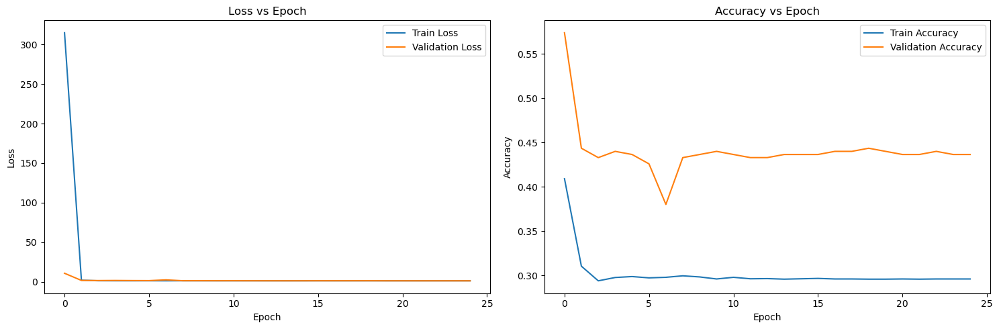

In [105]:
visualize_performance()

### Model Evaluation

In [106]:
# Model Evaluation with test dataset
test_loss, test_acc, all_labels, all_preds = evaluate_model(model, criterion, test_loader)

Test Progress: 100%|██████████████| 9/9 [00:13<00:00,  1.54s/batch, acc=tensor(0.4921, dtype=torch.float64), loss=1.43]


In [107]:
# Model Loss and Accuracy Values
print(f'Test Loss: {test_loss:.4f}')
print(f'Accuracy: {test_acc:.4f}')

Test Loss: 1.3451
Accuracy: 0.4366


In [108]:
# Classification Report
print('Classification Report:')
print(classification_report(all_labels, all_preds, target_names=class_names))

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        49
           1       0.33      0.02      0.03        57
           2       0.44      0.99      0.61       124
           3       0.00      0.00      0.00        54

    accuracy                           0.44       284
   macro avg       0.19      0.25      0.16       284
weighted avg       0.26      0.44      0.27       284



C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


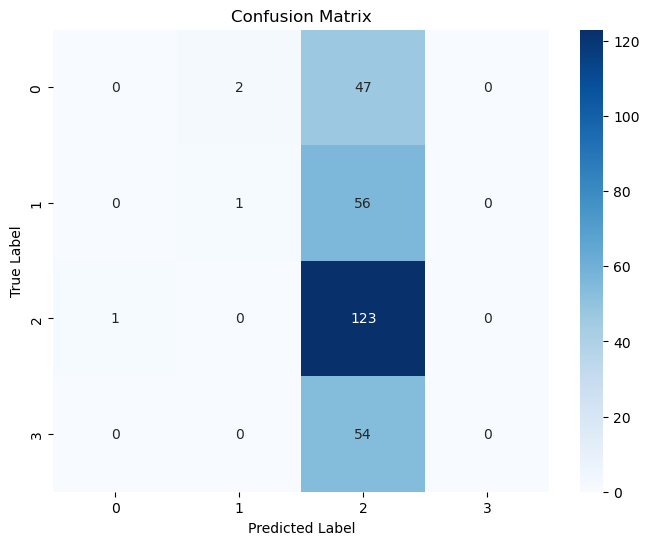

In [109]:
# Comparing Actual with Predicted values using Confusion matrix
plot_confusion_matrix(all_labels, all_preds)

## Optimized CNN Model Implementation using Pre-trained Model and Evaluation

### CNN Model

In [110]:
# Load pre-trained ResNet18 model
model = models.resnet18(pretrained=True)

# Modify the final layer to hold 4 classes (Grades)
num_ftrs = model.fc.in_features
num_classes = len(class_names)
model.fc = nn.Linear(num_ftrs, num_classes)
    
model = model.to(device)

C:\Users\User\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### Loss Function and Optimizer Initialization

In [111]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Learning rate scheduler to reduce the learning rate when a metric has stopped improving
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

C:\Users\User\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


### Model Training and Validation

In [112]:
train_loss_history = []
val_loss_history = []
train_acc_history = []
val_acc_history = []

if is_model_training:
    print ("Model training is started - miscellaneous optimization")
    early_stopping = EarlyStopping(patience=7)
    model = train_model_v3(model, criterion, optimizer,dataloaders,image_datasets,scheduler,early_stopping,num_epochs=25)
    print ("Model training is completed")
    # Saving the final model parameters
    best_model_wts = model.state_dict()
    torch.save(best_model_wts, 'best_model_wts_optimized_resnet18.pth')
else:
    print ("Model training is disabled")

Model training is started - miscellaneous optimization
Epoch 1/25
----------


Train Progress: 100%|████████| 150/150 [08:31<00:00,  3.41s/batch, acc=tensor(1.7754, dtype=torch.float64), loss=0.529]


train Loss: 0.7144 Accuracy: 0.7241


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.15s/batch, acc=tensor(0.8413, dtype=torch.float64), loss=1.38]


validation Loss: 0.6602 Accuracy: 0.7465
Epoch 2/25
----------


Train Progress: 100%|████████| 150/150 [09:05<00:00,  3.63s/batch, acc=tensor(2.0021, dtype=torch.float64), loss=0.232]


train Loss: 0.4844 Accuracy: 0.8166


Validation Progress: 100%|█████████| 9/9 [00:11<00:00,  1.24s/batch, acc=tensor(0.8452, dtype=torch.float64), loss=2.3]


validation Loss: 0.8387 Accuracy: 0.7500
Epoch 3/25
----------


Train Progress: 100%|████████| 150/150 [08:35<00:00,  3.43s/batch, acc=tensor(2.0590, dtype=torch.float64), loss=0.415]


train Loss: 0.4225 Accuracy: 0.8398


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.13s/batch, acc=tensor(0.8492, dtype=torch.float64), loss=2.38]


validation Loss: 0.8053 Accuracy: 0.7535
Epoch 4/25
----------


Train Progress: 100%|████████| 150/150 [08:15<00:00,  3.30s/batch, acc=tensor(2.1436, dtype=torch.float64), loss=0.536]


train Loss: 0.3432 Accuracy: 0.8743


Validation Progress: 100%|████████| 9/9 [00:11<00:00,  1.23s/batch, acc=tensor(0.8929, dtype=torch.float64), loss=1.36]


validation Loss: 0.6386 Accuracy: 0.7923
Epoch 5/25
----------


Train Progress: 100%|████████| 150/150 [08:09<00:00,  3.26s/batch, acc=tensor(2.1662, dtype=torch.float64), loss=0.253]


train Loss: 0.3218 Accuracy: 0.8835


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.15s/batch, acc=tensor(0.9722, dtype=torch.float64), loss=1.31]


validation Loss: 0.5376 Accuracy: 0.8627
Epoch 6/25
----------


Train Progress: 100%|████████| 150/150 [08:23<00:00,  3.35s/batch, acc=tensor(2.1964, dtype=torch.float64), loss=0.303]


train Loss: 0.2748 Accuracy: 0.8958


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.13s/batch, acc=tensor(0.9563, dtype=torch.float64), loss=1.58]


validation Loss: 0.4935 Accuracy: 0.8486
Epoch 7/25
----------


Train Progress: 100%|████████| 150/150 [08:15<00:00,  3.31s/batch, acc=tensor(2.2349, dtype=torch.float64), loss=0.407]


train Loss: 0.2305 Accuracy: 0.9115


Validation Progress: 100%|████████| 9/9 [00:10<00:00,  1.13s/batch, acc=tensor(0.9484, dtype=torch.float64), loss=1.61]


validation Loss: 0.4985 Accuracy: 0.8415
Epoch 8/25
----------


Train Progress: 100%|████████| 150/150 [08:13<00:00,  3.29s/batch, acc=tensor(2.2554, dtype=torch.float64), loss=0.466]


train Loss: 0.2154 Accuracy: 0.9199


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.11s/batch, acc=tensor(0.9484, dtype=torch.float64), loss=1.99]


validation Loss: 0.6592 Accuracy: 0.8415
Epoch 9/25
----------


Train Progress: 100%|████████| 150/150 [08:00<00:00,  3.21s/batch, acc=tensor(2.2533, dtype=torch.float64), loss=0.119]


train Loss: 0.2196 Accuracy: 0.9191


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.01batch/s, acc=tensor(0.9484, dtype=torch.float64), loss=2.13]


validation Loss: 0.5743 Accuracy: 0.8415
Epoch 10/25
----------


Train Progress: 100%|████████| 150/150 [07:29<00:00,  3.00s/batch, acc=tensor(2.3026, dtype=torch.float64), loss=0.245]


train Loss: 0.1629 Accuracy: 0.9391


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.01batch/s, acc=tensor(0.8214, dtype=torch.float64), loss=1.63]


validation Loss: 1.0196 Accuracy: 0.7289
Epoch 11/25
----------


Train Progress: 100%|██████| 150/150 [07:25<00:00,  2.97s/batch, acc=tensor(2.2826, dtype=torch.float64), loss=0.00734]


train Loss: 0.1847 Accuracy: 0.9310


Validation Progress: 100%|████████| 9/9 [00:08<00:00,  1.03batch/s, acc=tensor(0.9325, dtype=torch.float64), loss=1.35]


validation Loss: 0.5472 Accuracy: 0.8275
Epoch 12/25
----------


Train Progress: 100%|████████| 150/150 [07:19<00:00,  2.93s/batch, acc=tensor(2.3277, dtype=torch.float64), loss=0.426]


train Loss: 0.1393 Accuracy: 0.9494


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.02s/batch, acc=tensor(0.8810, dtype=torch.float64), loss=2.85]


validation Loss: 0.8673 Accuracy: 0.7817
Epoch 13/25
----------


Train Progress: 100%|████████| 150/150 [07:15<00:00,  2.91s/batch, acc=tensor(2.3810, dtype=torch.float64), loss=0.027]


train Loss: 0.0849 Accuracy: 0.9711


Validation Progress: 100%|████████| 9/9 [00:09<00:00,  1.03s/batch, acc=tensor(0.9722, dtype=torch.float64), loss=1.92]

Early stopping
Model training is completed


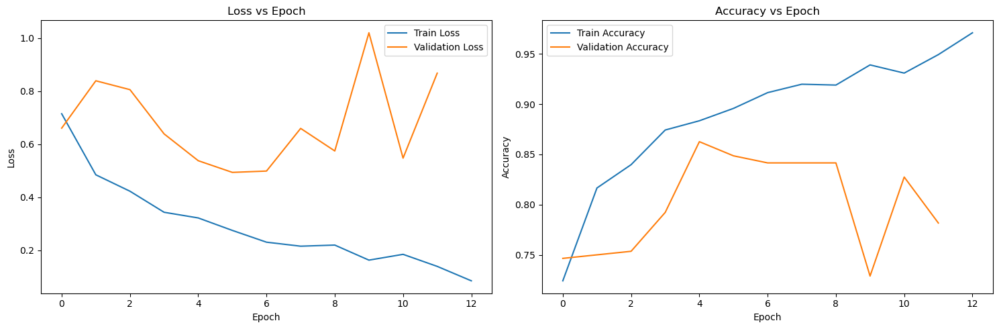

In [113]:
visualize_performance()

### Model Evaluation

In [114]:
# Model Evaluation with test dataset
test_loss, test_acc, all_labels, all_preds = evaluate_model(model, criterion, test_loader)

Test Progress: 100%|██████████████| 9/9 [00:08<00:00,  1.04batch/s, acc=tensor(0.9365, dtype=torch.float64), loss=1.32]


In [115]:
# Model Loss and Accuracy Values
print(f'Test Loss: {test_loss:.4f}')
print(f'Accuracy: {test_acc:.4f}')

Test Loss: 0.6776
Accuracy: 0.8310


In [116]:
# Classification Report
print('Classification Report:')
print(classification_report(all_labels, all_preds, target_names=class_names))

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.94      0.90        49
           1       0.72      0.86      0.78        57
           2       0.85      0.85      0.85       124
           3       0.92      0.67      0.77        54

    accuracy                           0.83       284
   macro avg       0.84      0.83      0.83       284
weighted avg       0.84      0.83      0.83       284



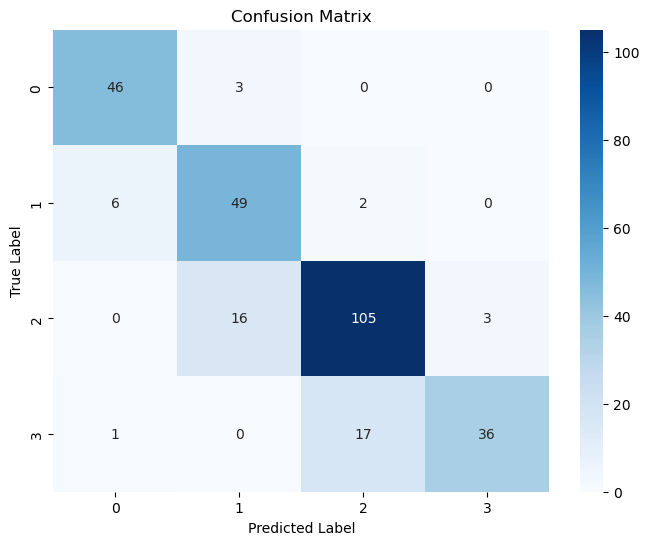

In [117]:
# Comparing Actual with Predicted values using Confusion matrix
plot_confusion_matrix(all_labels, all_preds)

# Model Prediction

Special Note: Below code is used only to test the model. Comprehensive solution is given in the implemented Web Application.

## Load the Best CNN Model with Best Model Weights

In [118]:
# Define the device to execute the Model
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Initialize the CNN model and transferr it to the device
model = TeakGradeCNNOptimized2(num_classes=4)

if is_loading_saved_model:
    # Check if the model file exists before loading
    if os.path.exists('best_model_wts_optimized_2.pth'):
        model.load_state_dict(torch.load('best_model_wts_optimized_2.pth'))
    else:
        print("Could not locate the saved model")

model = model.to(device)

C:\Users\User\AppData\Local\Temp\ipykernel_15372\2779849533.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model_wts_optimized_2

## Making Sample Predictions

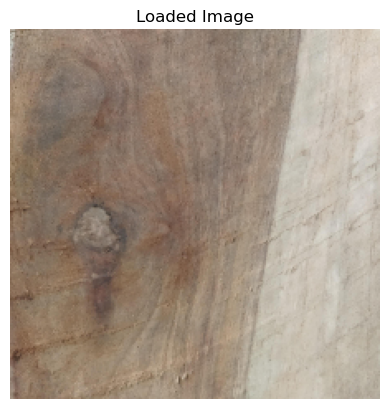

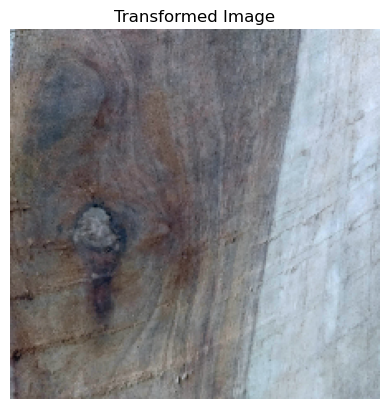

Predicted grade: 1


In [119]:
# Transform pipeline for new image
pred_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),        
    transforms.Normalize(mean=mean, std=std)
])

def diplay_image(image,title):
    plt.imshow(image)
    plt.axis('off')  # Hide axes for better visualization
    plt.title(title)
    plt.show()

# Load and preprocess the image
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    
    diplay_image(image,"Loaded Image")
    
    image = transformed_image = pred_transform(image)  # Apply the same transformations
    
    # Convert the normalized tensor to a displayable format
    # Convert from CHW to HWC
    transformed_image = transformed_image.permute(1, 2, 0).numpy()
    # Normalize to [0, 1] for display
    transformed_image = (transformed_image - transformed_image.min()) / (transformed_image.max() - transformed_image.min())
    
    # Display the transformed image
    diplay_image(transformed_image,"Transformed Image")
    
    image = image.unsqueeze(0)  # Add batch dimension (1, 3, 224, 224)
    return image

# Perform prediction
def predict_image(image_path, model):
    model.eval()
    image = load_image(image_path).to(device)
    with torch.no_grad():
        outputs = model(image) 
        _, predicted = torch.max(outputs, 1)
    return predicted.item()

# Loading new X-Ray image
image_path = 'dataset/pred/3.png'
predicted_grade = predict_image(image_path, model)
print(f"Predicted grade: {predicted_grade}")

# Model Explanation

## Model Explanation using Grad-CAM

Special Note: Below code is used only to test the feature. Comprehensive solution is given in the implemented Web Application.

In [120]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.forward_output = None
        self.model.eval()
        
        # Register hooks for gradients
        self.target_layer.register_forward_hook(self.forward_hook)
        self.target_layer.register_backward_hook(self.backward_hook)

    def forward_hook(self, module, input, output):
        self.forward_output = output  # Save the output of the layer

    def backward_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0]  # Save the gradients

    def generate_heatmap(self, input_image, target_class=None):
        # Forward pass
        output = self.model(input_image)
        if target_class is None:
            target_class = torch.argmax(output)  # Use predicted class if not provided

        # Zero all gradients and do backward pass
        self.model.zero_grad()
        output[:, target_class].backward(retain_graph=True)

        # Generate Grad-CAM heatmap
        weights = torch.mean(self.gradients, dim=(2, 3))  # Global average pooling
        grad_cam_map = torch.sum(weights[:, :, None, None] * self.forward_output, dim=1).squeeze()

        # Apply ReLU and normalize heatmap
        grad_cam_map = F.relu(grad_cam_map)
        grad_cam_map = grad_cam_map.cpu().data.numpy()
        heatmap = (grad_cam_map - grad_cam_map.min()) / (grad_cam_map.max() - grad_cam_map.min())  # Normalize

        return heatmap

In [121]:
def overlay_heatmap(heatmap, img_path, alpha=0.5, colormap=cv2.COLORMAP_JET):
    # Load the image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize heatmap to match the input image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Convert heatmap to a color map
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, colormap)

    # Overlay heatmap on the image
    overlayed_img = cv2.addWeighted(img, alpha, heatmap, 1 - alpha, 0)

    return overlayed_img

In [122]:
def explian_image(model,preprocessed_image ,img_path):
    grad_cam = GradCAM(model, target_layer=model.conv4)  # Target last conv layer
    heatmap = grad_cam.generate_heatmap(preprocessed_image)

    # Overlay heatmap on original image
    overlayed_image = overlay_heatmap(heatmap, img_path)

    return overlayed_image

C:\Users\User\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1640: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


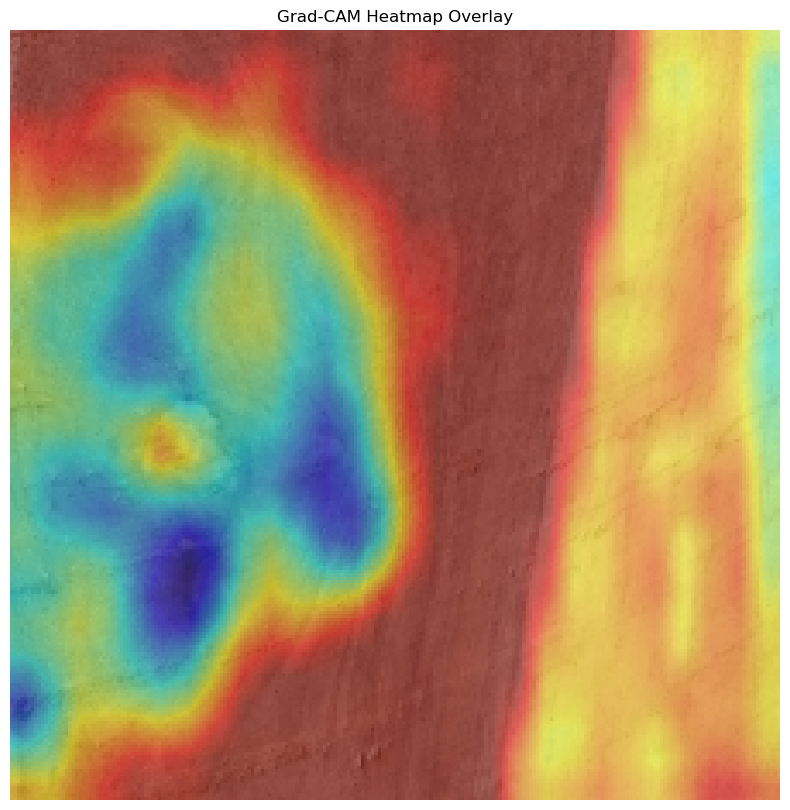

In [123]:
img_path = "dataset/pred/3.png"  # Change this to the actual path
img = Image.open(img_path).convert('RGB')

input_tensor = pred_transform(img).unsqueeze(0)  # Add batch dimension

# Initialize Grad-CAM
grad_cam = GradCAM(model, target_layer=model.conv4)  # Targeting the last conv layer
heatmap = grad_cam.generate_heatmap(input_tensor)

# Overlay heatmap on original image
overlayed_image = overlay_heatmap(heatmap, img_path)

plt.figure(figsize=(10, 10))
plt.imshow(overlayed_image)
plt.axis('off')
plt.title("Grad-CAM Heatmap Overlay")
plt.show()

# Utilizing GenAI

## Utilizing GenAI to identify Teak Wood Grade

Special Note: Below code is used only to test the feature. Comprehensive solution is given in the implemented Web Application.

### Environment Setup

In [19]:
#Correct API Key is removed when submitting the course work due to privacy reasons
# %env OPENAI_API_KEY=

In [126]:
# Initializing OpenAI
client = OpenAI()

### loading the image

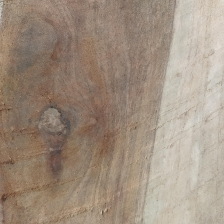

In [127]:
image_path_gen_id = 'dataset/pred/3.png'
img = IMG(image_path_gen_id)
display(img)

### Image Captioning

In [128]:
system_prompt = '''
    You will be provided with an image of swan teak wood.
    The image may contain regions of both Sapwood and Heartwood or only one of them.
    There are three grades: A, B, and C, based on the percentage of Sapwood and Heartwood.
    Heartwood percentage above 90% qualifies as Grade A.
    provide the Sapwood and Heartwood percentage.
    provide the Grade of swan teak wood at last in short.
    Additionally, provide the teak wood type.
'''

In [130]:
# Function to encode images in order to upload to gpt API
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')

In [131]:
# Function which call the API for image captioning
def analyze_image(img_url, title):
    encoded_image = encode_image(img_url)
    response = client.chat.completions.create(
    model="gpt-4-turbo",
    messages=[
        {
            "role": "system",
            "content": system_prompt
        },
        {
            "role": "user",
            "content": [
                {"type": "image_url",
                "image_url": {
                "url": f"data:image/jpeg;base64,{encoded_image}"
                }
                },
            ],
        },
        {
            "role": "user",
            "content": title
        }
    ],
        max_tokens=300,
        top_p=0.1
    )

    return response.choices[0].message.content

In [132]:
result = analyze_image(image_path, "Image of Swan Teak Wood")
print(result)

In the provided image of Swan Teak Wood, you can observe both Sapwood and Heartwood. The Heartwood is visible as the darker, richer brown area, typically found at the center of the log, while the Sapwood is the lighter, almost white or pale yellow section, usually located on the outer edges of the wood.

From the image, it appears that the Heartwood constitutes about 70% of the visible area, and the Sapwood makes up about 30%.

Based on the grading criteria:
- Heartwood percentage above 90% qualifies as Grade A.
- Since the Heartwood in this image is around 70%, this wood would be classified as Grade B.

Teak Wood Type: Swan Teak Wood
Grade: B
